# Solution of Schrodinger's 1D wave equation for Simple Harmonic Oscillator potential
Using Odeint()

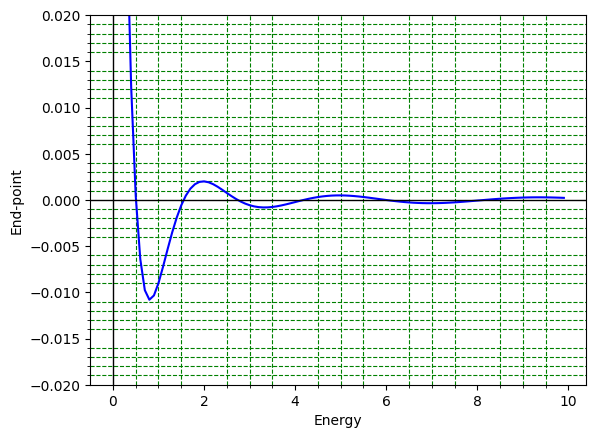

Enter 1st energy guess :  1
Enter 2nd energy guess :  2


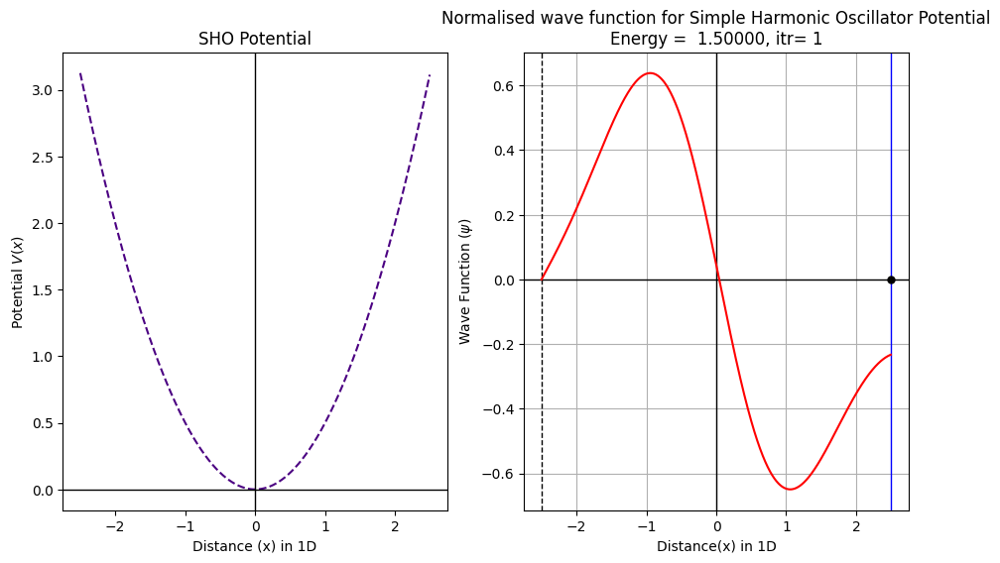

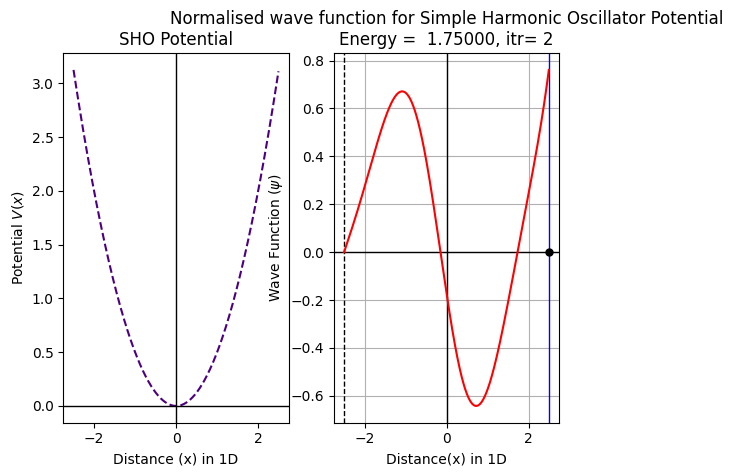

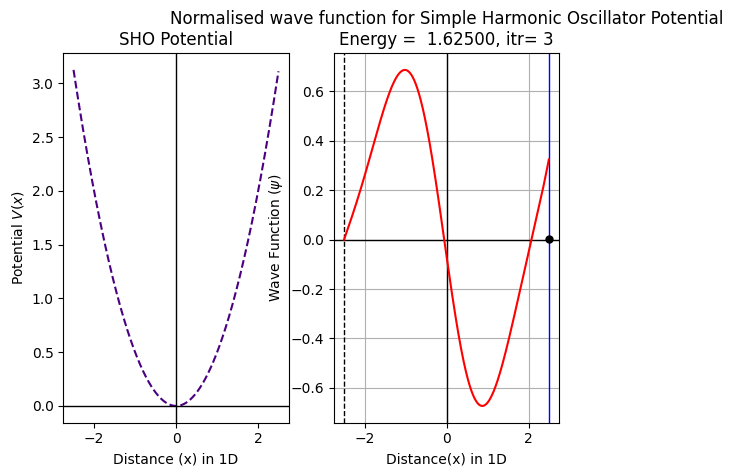

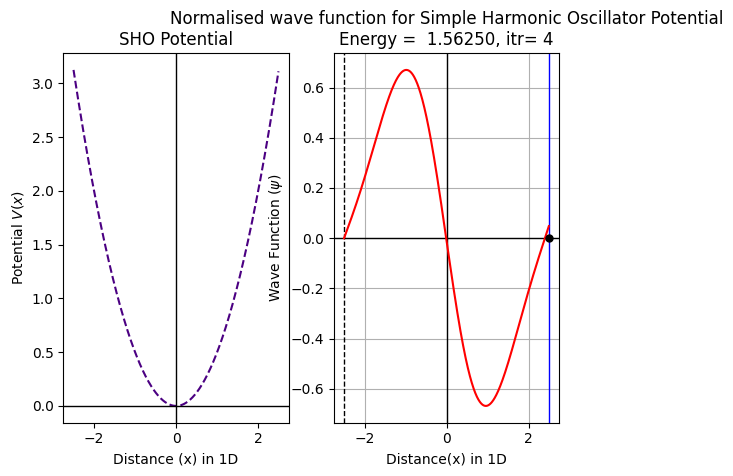

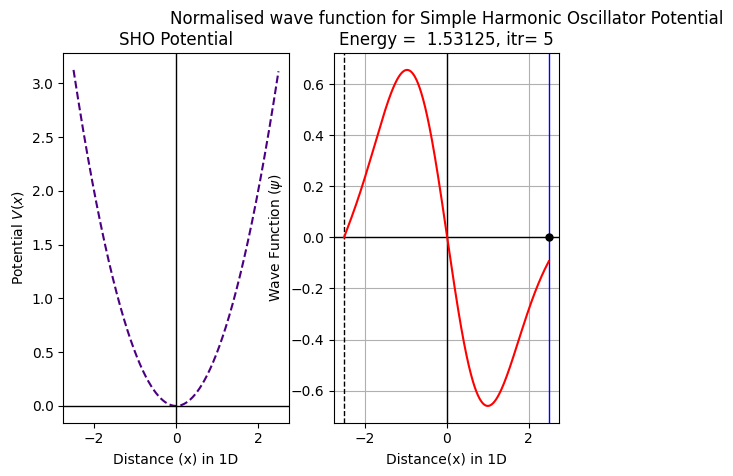

...

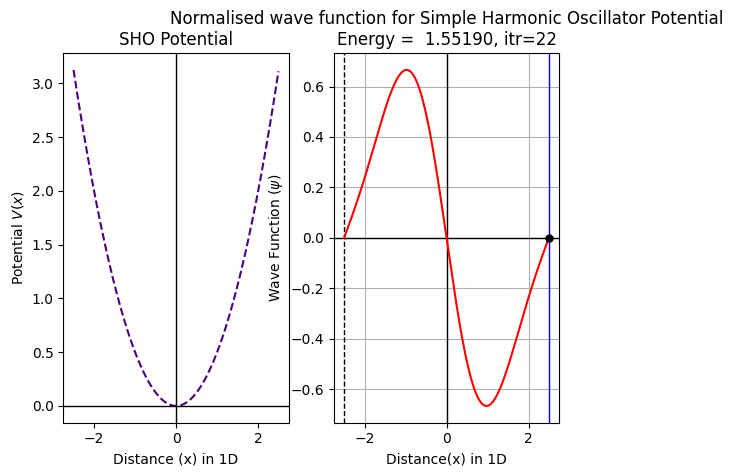

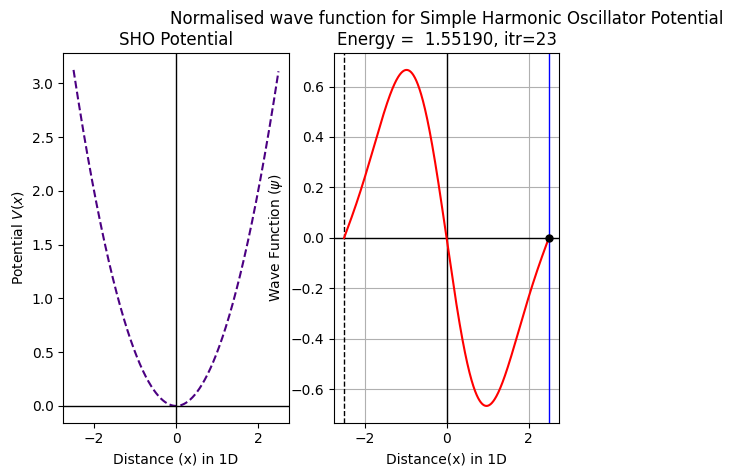

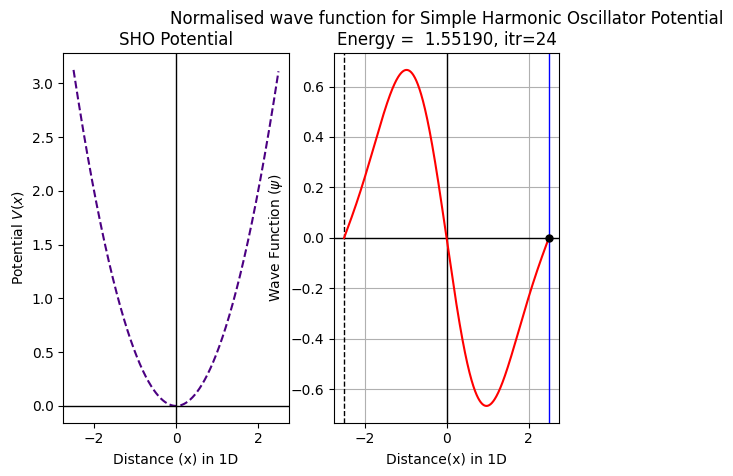

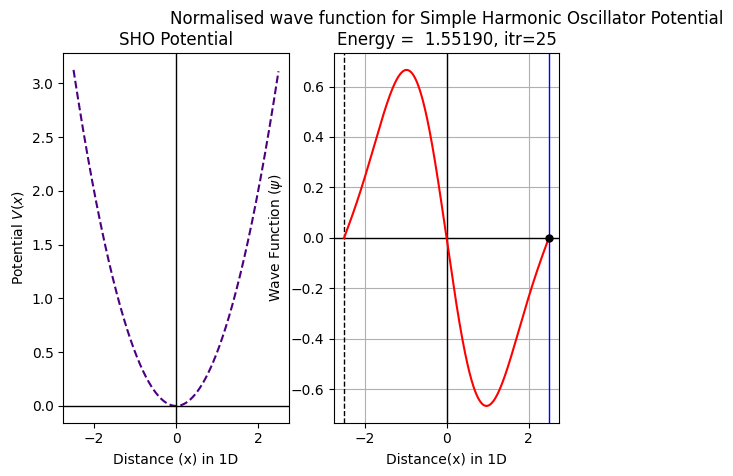

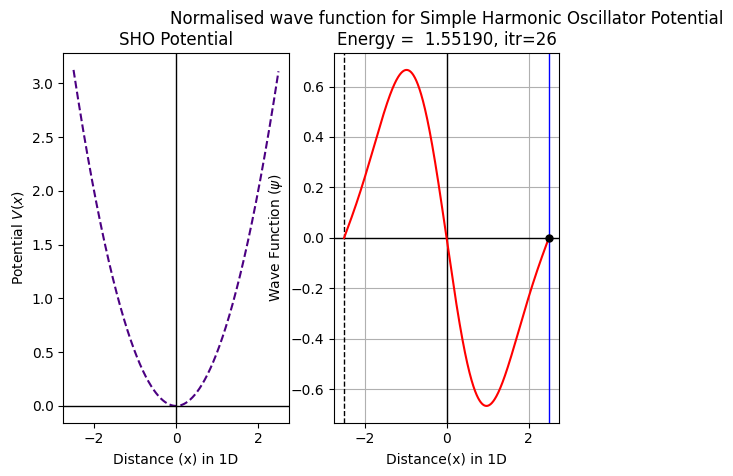

The energy satisfying the boundary condition is 1.5519045367836952


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint,simpson

#Define the dimensionless potential
def V(x):
    omega=1
    return x**2/2

#Define the dimensionless Time Independent Schrodinger Equation in odeint()
def SHO(y,x,E):
    y1=y[0]
    y2=y[1]
    yp1=y2                
    yp2=-2*(E-V(x))*y1
    yp=[yp1,yp2]
    return yp


#Boundary Conditions for a wave function
x0,y0,xn,yn=-2.5,0,2.5,0            
n=1000
h=(xn-x0)/n
x=np.arange(x0,xn,h)
L=len(x)
alpha=0.001         #Initial derivative (can be anything as it doesn't control the solution after normalization)
y0=[0.00,alpha]     #Initial condition for y and y' 
      


#Guessing energy value from plot
def shoot(E):
    u=odeint(SHO,y0,x,args=(E,))
    return u[:,0][-1]

energies=np.arange(0,10,0.1)
H=[]
for i in energies:
    hits=shoot(i)
    H.append(hits)
    
plt.plot(energies,H,'b-')
plt.axhline(color='black',lw=1)
plt.axvline(color='black',lw=1)
plt.xlabel('Energy')
plt.ylabel('End-point')
plt.ylim(-0.02,0.02)
plt.minorticks_on()
plt.grid(which='minor',color='green',ls='--')
plt.show()


#Bisection-Shooting method for proper choice of energy
while True:
    E1=eval(input('Enter 1st energy guess : '))
    E2=eval(input('Enter 2nd energy guess : '))
    uA=odeint(SHO,y0,x,args=(E1,))
    uB=odeint(SHO,y0,x,args=(E2,))
    solA=uA[:,0]
    solB=uB[:,0]
    if solA[L-1]*solB[L-1]<0.0:
        break
    else:
        print('Incorrect sssumption of guesses\nEnter new guesses')


itr=0
plt.figure(figsize=(11,6)) 
while True:
    u1=odeint(SHO,y0,x,args=(E1,))
    sol1=u1[:,0]
    u2=odeint(SHO,y0,x,args=(E2,))
    sol2=u2[:,0]
    E3=(E1+E2)/2
    u3=odeint(SHO,y0,x,args=(E3,))
    sol3=u3[:,0]
    if sol1[L-1]*sol3[L-1]==0:
        break
    if sol1[L-1]*sol3[L-1]<0.0:
        E2=E3
    else:
        E1=E3
    itr=itr+1
    acc=abs(E1-E2)
    if acc<0.00000001:
        break
    
    
#Normalisation of wave function
    N=1/np.sqrt(simpson(sol3*sol3,x=x))
    sol3=N*sol3
    
#Plotting and printing
    plt.subplot(121)
    plt.plot(x,V(x),'--',color='indigo')
    plt.ylabel(r'Potential $V(x)$')
    plt.xlabel('Distance (x) in 1D')
    plt.title('SHO Potential')
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    
    plt.subplot(122)
    plt.cla()
    plt.title('Normalised wave function for Simple Harmonic Oscillator Potential\n'+r'Energy =%9.5f, itr=%2i'%(E3,itr))
    plt.xlabel('Distance(x) in 1D')
    plt.ylabel(r'Wave Function ($\psi$)')
    plt.grid()
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    plt.axvline(x=xn,color='blue',lw=1)
    plt.axvline(x=x0,color='black',lw=1,ls='--')
    plt.plot(x,sol3,'r',lw=1.5)
    plt.plot(x[-1],u3[-1,0],'o',color='black',ms=5)
    plt.pause(0.5)
    
plt.show()
print('The energy satisfying the boundary condition is',E3)

# Solution of Schrodinger's 1D wave equation for Anharmonic Oscillator potential
Using Odeint()

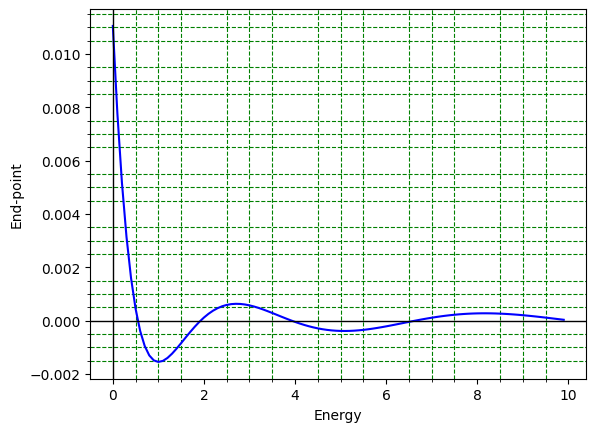

Enter 1st energy guess :  0
Enter 2nd energy guess :  1


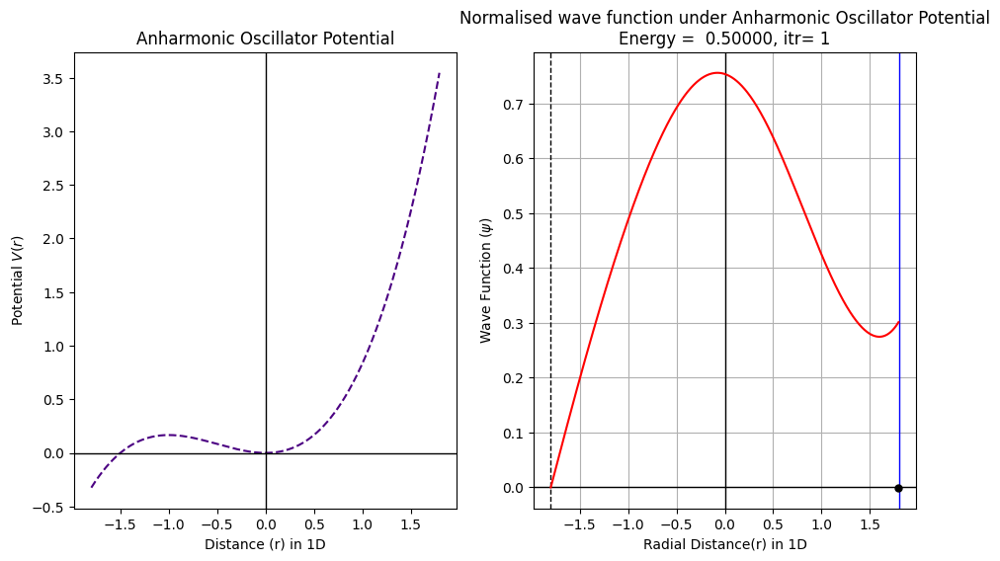

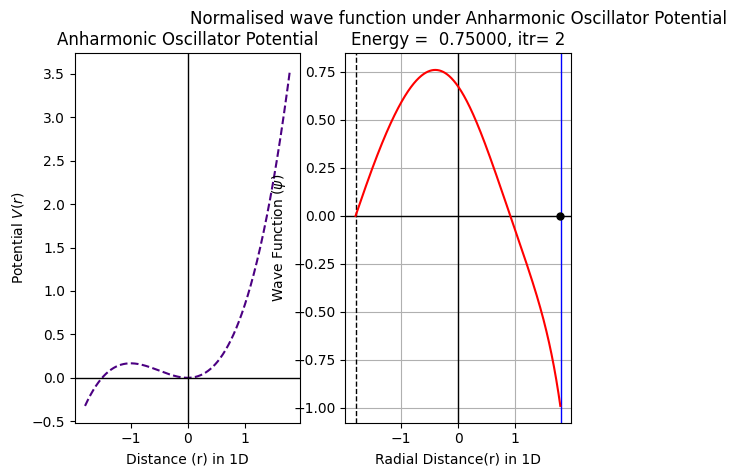

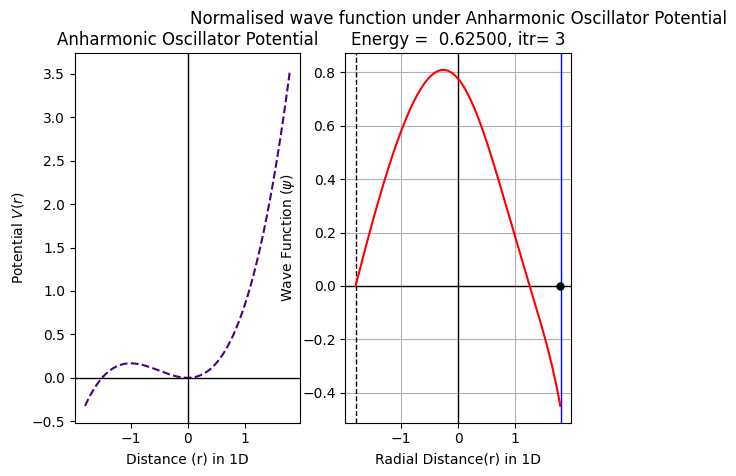

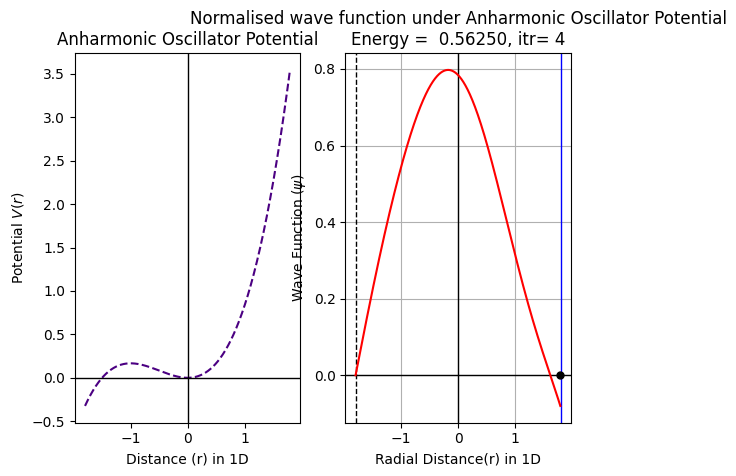

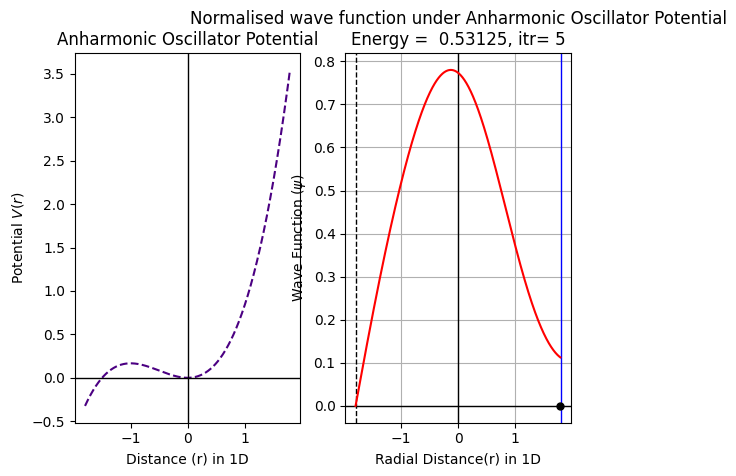

...

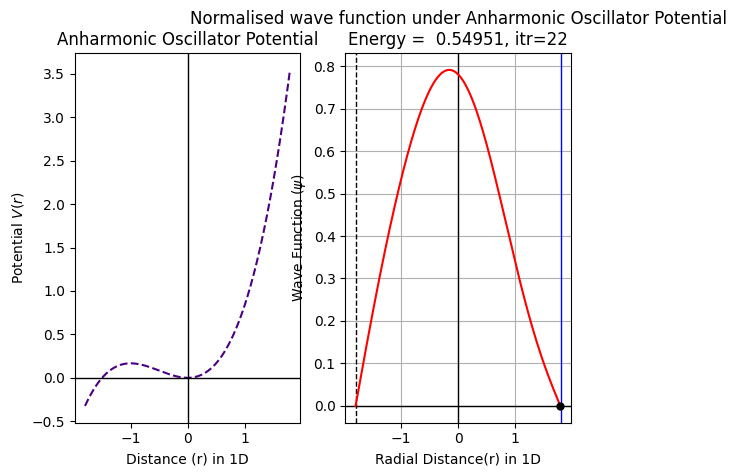

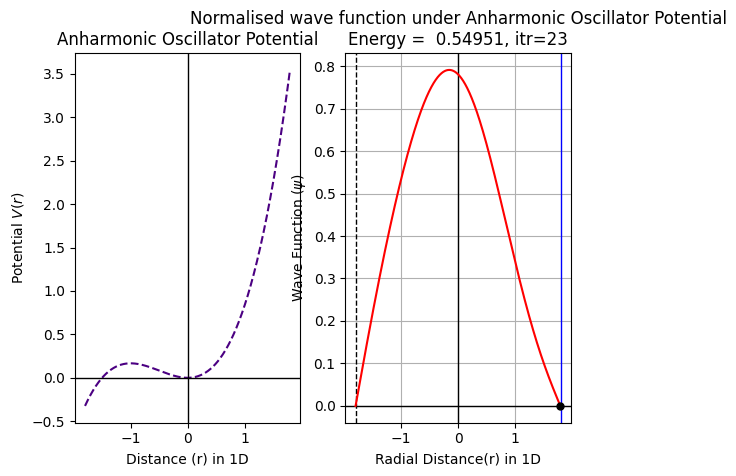

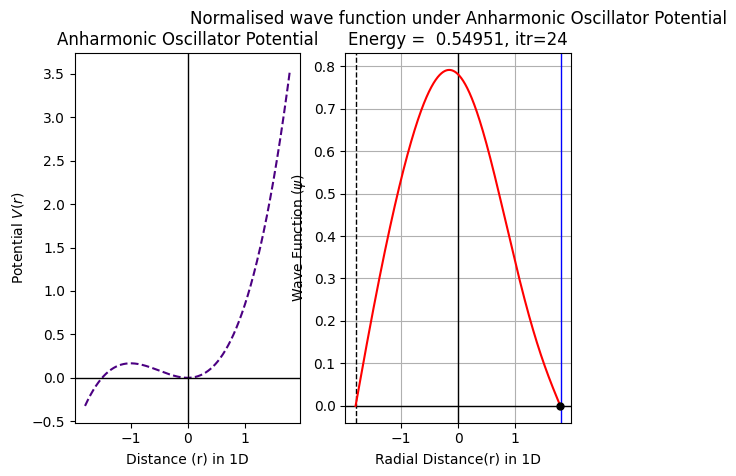

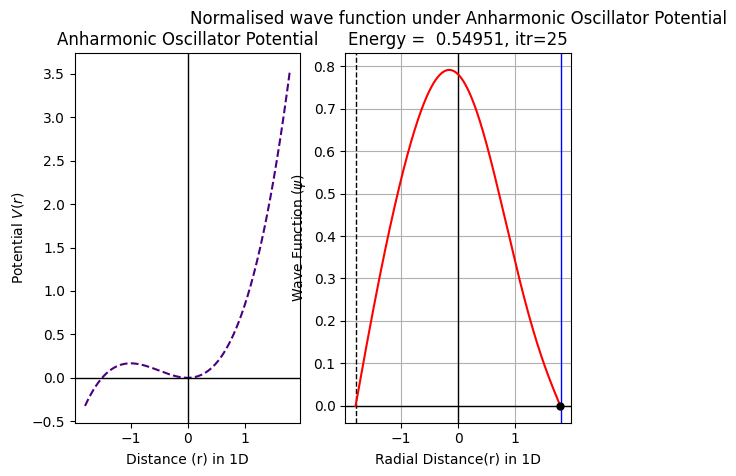

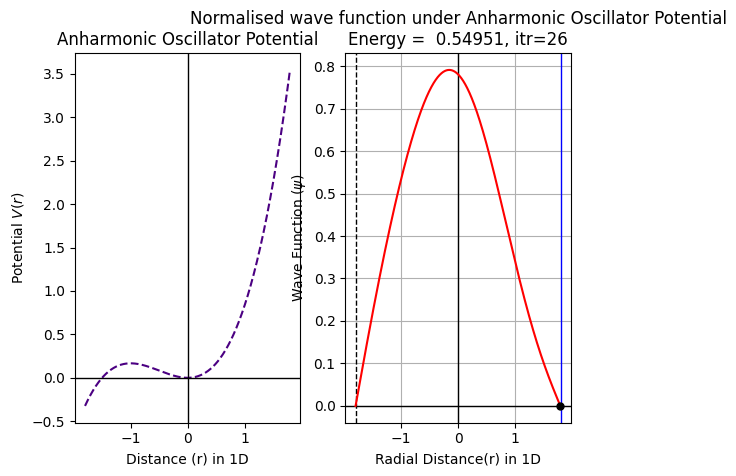

The energy satisfying the boundary condition is 0.5495097264647484


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint,simpson

#Define the dimensionless potential
def V(r):
    b=1
    k=1
    return (k*r**2)/2+(b*r**3)/3

#Define the dimensionless Time Independent Schrodinger Equation in odeint()
def AHO(y,r,E):
    y1=y[0]
    y2=y[1]
    yp1=y2  
    yp2=-2*(E-V(r))*y1
    yp=[yp1,yp2]
    return yp

#Boundary Conditions for a wave function
r0,y0,rn,yn=-1.8,0,1.8,0           
n=1000
h=(rn-r0)/n
r=np.arange(r0,rn,h)         
L=len(r)
alpha=0.001         #Initial derivative (can be anything as it doesn't control the solution after normalization)
y0=[0.00,alpha]     #Initial condition for y and y' 
      

#Guessing energy value from plot
def shoot(E):
    u=odeint(AHO,y0,r,args=(E,))
    return u[:,0][-1]

energies=np.arange(0,10,0.1)
H=[]
for i in energies:
    hits=shoot(i)
    H.append(hits)
    
plt.plot(energies,H,'b-')
plt.axhline(color='black',lw=1)
plt.axvline(color='black',lw=1)
plt.xlabel('Energy')
plt.ylabel('End-point')
plt.minorticks_on()
plt.grid(which='minor',color='green',ls='--')
plt.show()


#Bisection-Shooting method for proper choice of energy
while True:
    E1=eval(input('Enter 1st energy guess : '))
    E2=eval(input('Enter 2nd energy guess : '))
    uA=odeint(AHO,y0,r,args=(E1,))
    uB=odeint(AHO,y0,r,args=(E2,))
    solA=uA[:,0]
    solB=uB[:,0]
    if solA[L-1]*solB[L-1]<0.0:
        break
    else:
        print('Incorrect sssumption of guesses\nEnter new guesses')


itr=0
plt.figure(figsize=(11,6)) 
while True:
    u1=odeint(AHO,y0,r,args=(E1,))
    sol1=u1[:,0]
    u2=odeint(AHO,y0,r,args=(E2,))
    sol2=u2[:,0]
    E3=(E1+E2)/2
    u3=odeint(AHO,y0,r,args=(E3,))
    sol3=u3[:,0]
    if sol1[L-1]*sol3[L-1]==0:
        break
    if sol1[L-1]*sol3[L-1]<0.0:
        E2=E3
    else:
        E1=E3
    itr=itr+1
    acc=abs(E1-E2)
    if acc<0.00000001:
        break
   
    

#Normalisation of wave function
    N=1/np.sqrt(simpson(sol3*sol3,x=r))
    sol3=N*sol3
    
#Plotting and printing
    plt.subplot(121)
    plt.plot(r,V(r),'--',color='indigo')
    plt.ylabel(r'Potential $V(r)$')
    plt.xlabel('Distance (r) in 1D')
    plt.title('Anharmonic Oscillator Potential')
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
  
    plt.subplot(122)
    plt.cla()
    plt.title('Normalised wave function under Anharmonic Oscillator Potential\n'+r'Energy =%9.5f, itr=%2i'%(E3,itr))
    plt.xlabel('Radial Distance(r) in 1D')
    plt.ylabel(r'Wave Function ($\psi$)')
    plt.grid()
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    plt.axvline(x=rn,color='blue',lw=1)
    plt.axvline(x=r0,color='black',lw=1,ls='--')
    plt.plot(r,sol3,'r',lw=1.5)
    plt.plot(r[-1],-u3[-1,0],'o',color='black',ms=5)
    plt.pause(0.5)
    
plt.show()
print('The energy satisfying the boundary condition is',E3)

# Solution of Schrodinger's 1D wave equation for Coulomb potential
Using Odeint()

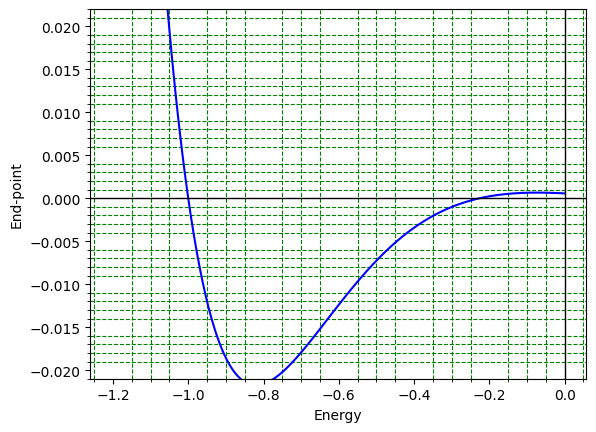

Enter 1st energy guess :  -0.2
Enter 2nd energy guess :  -0.4


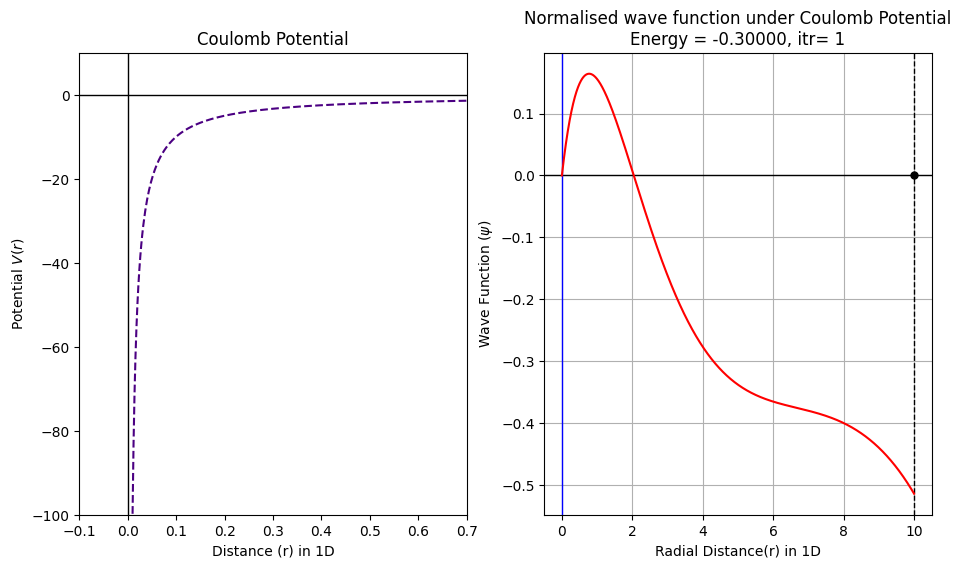

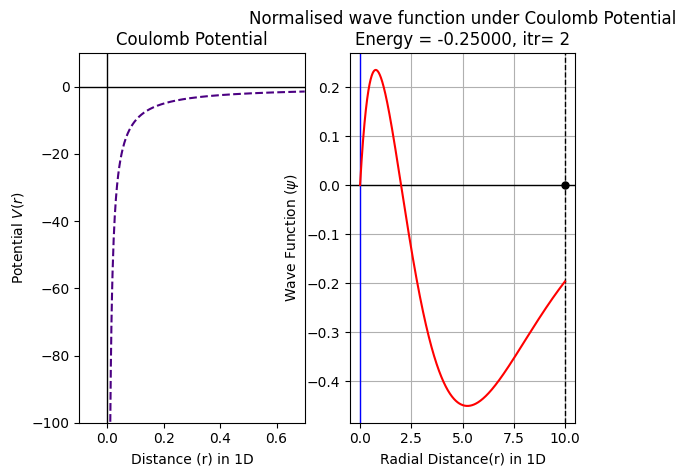

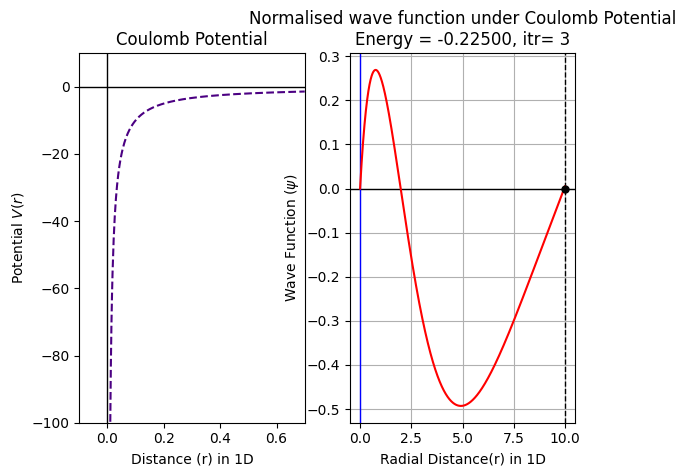

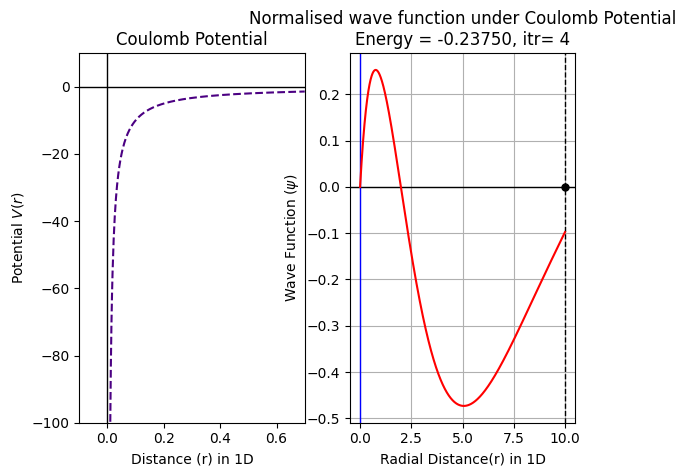

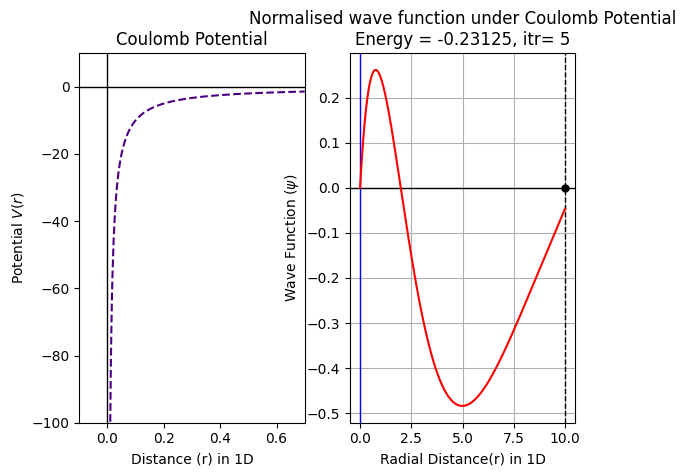

...

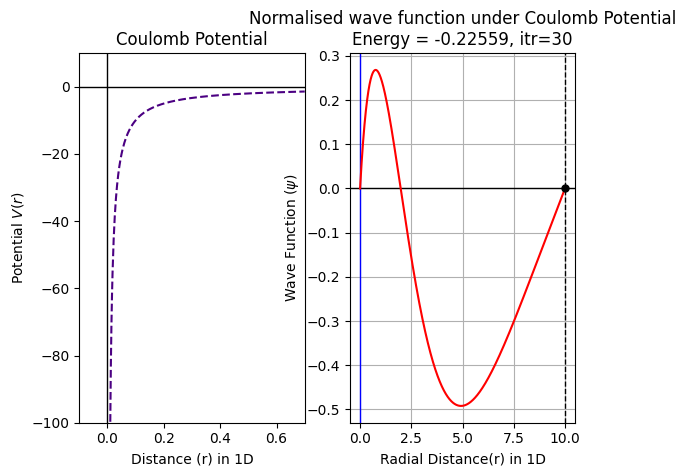

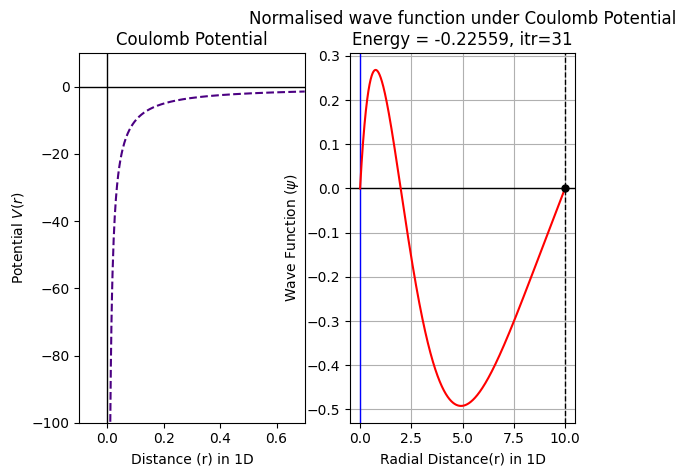

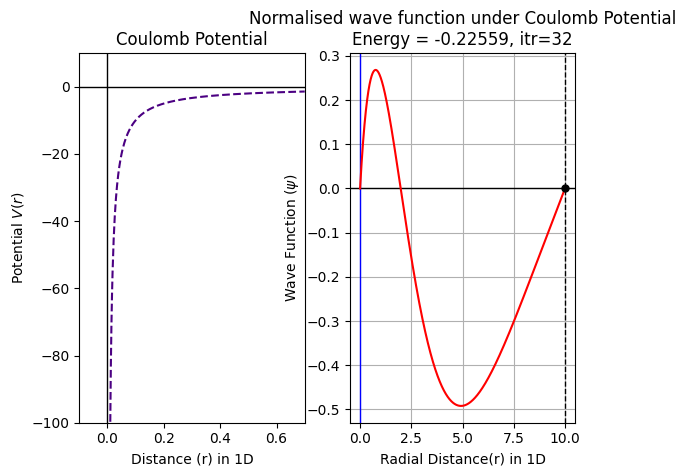

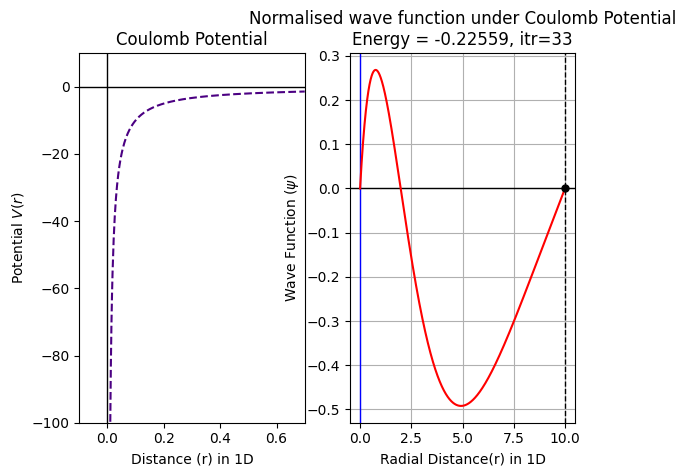

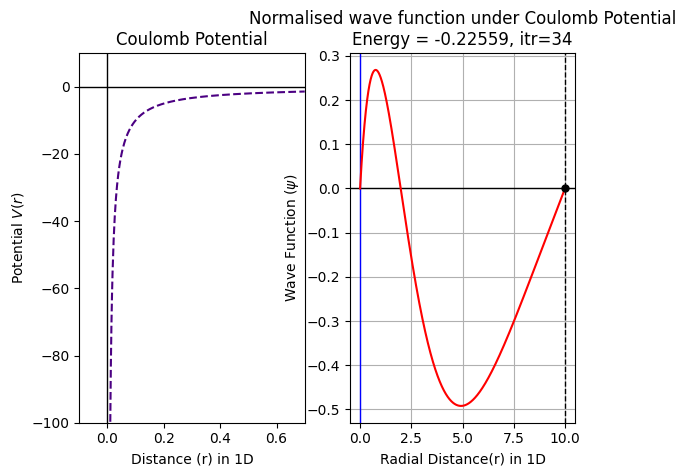

The energy satisfying the boundary condition is -3.0680495400773364 eV


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint,simpson

#Define the dimensionless potential
def V(r):
    return -1/r

#Define the dimensionless Time Independent Schrodinger Equation in odeint()
def Coulomb(y,r,E):
    y1=y[0]
    y2=y[1]
    yp1=y2
    yp2=-2*(E/2-V(r))*y1
    yp=[yp1,yp2]
    return yp

#Boundary Conditions for a wave function 
#Large end point to capture many Coulomb Potential states before infinite well states (positive energies) take over when the system actually responds to the finite boundary conditions for higher excited states
#Larger the boundary, more tolerance required for wavefunction to converge
r0,y0,rn,yn=1e-7,0,10,0
#r0,y0,rn,yn=1e-12,0,200,0
r=np.arange(r0,rn,0.002)
L=len(r)
alpha=0.001         #Initial derivative (can be anything as it doesn't control the solution after normalization)
y0=[0.00,alpha]     #Initial condition for y and y' 
      


#Guessing energy value from plot
def shoot(E):
    u=odeint(Coulomb,y0,r,args=(E,))
    return u[:,0][-1]

#Energies are negative (-1/n**2) with maximum value of -1.0 (scaled system) for the Coulomb Potential
energies=np.arange(-1.2,0,0.002)
H=[]
for i in energies:
    hits=shoot(i)
    H.append(hits)
    
plt.plot(energies,H,'b-')
plt.axhline(color='black',lw=1)
plt.axvline(color='black',lw=1)
plt.xlabel('Energy')
plt.ylabel('End-point')
plt.ylim(-0.021,0.022)
plt.minorticks_on()
plt.grid(which='minor',color='green',ls='--')
plt.show()


#Bisection-Shooting method for proper choice of energy
while True:
    E1=eval(input('Enter 1st energy guess : '))
    E2=eval(input('Enter 2nd energy guess : '))
    uA=odeint(Coulomb,y0,r,args=(E1,))
    uB=odeint(Coulomb,y0,r,args=(E2,))
    solA=uA[:,0]
    solB=uB[:,0]
    if solA[L-1]*solB[L-1]<0.0:
        break
    else:
        print('Incorrect sssumption of guesses\nEnter new guesses')

itr=0
plt.figure(figsize=(11,6)) 
while True:
    u1=odeint(Coulomb,y0,r,args=(E1,))
    sol1=u1[:,0]
    u2=odeint(Coulomb,y0,r,args=(E2,))
    sol2=u2[:,0]
    E3=(E1+E2)/2
    u3=odeint(Coulomb,y0,r,args=(E3,))
    sol3=u3[:,0]
    if sol1[L-1]*sol3[L-1]==0:
        break
    if sol1[L-1]*sol3[L-1]<0.0:
        E2=E3
    else:
        E1=E3
    itr=itr+1
    acc=abs(E1-E2)
    if acc<0.00000000001:
        break
    
    
#Normalisation of wave function
    N=1/np.sqrt(simpson(sol3*sol3,x=r))
    sol3=N*sol3
    
#Plotting and printing
    plt.subplot(121)
    plt.plot(r,V(r),'--',color='indigo')
    plt.ylabel(r'Potential $V(r)$')
    plt.xlabel('Distance (r) in 1D')
    plt.title('Coulomb Potential')
    plt.xlim(-0.1,0.7)
    plt.ylim(-100,10)
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
  
    plt.subplot(122)
    plt.cla()
    plt.title('Normalised wave function under Coulomb Potential\n'+r'Energy =%9.5f, itr=%2i'%(E3,itr))
    plt.xlabel('Radial Distance(r) in 1D')
    plt.ylabel(r'Wave Function ($\psi$)')
    plt.grid()
    plt.axhline(color='black',lw=1)
    plt.axvline(x=r0,color='blue',lw=1)
    plt.axvline(x=rn,color='black',lw=1,ls='--')
    plt.plot(r,sol3,'r',lw=1.5)
    plt.plot(r[-1],-u3[-1,0],'o',color='black',ms=5)
    plt.pause(0.5)
    
plt.show()
print('The energy satisfying the boundary condition is',13.6*E3,'eV')

# Solution of Schrodinger's 1D wave equation for Yukawa potential
Using Odeint()

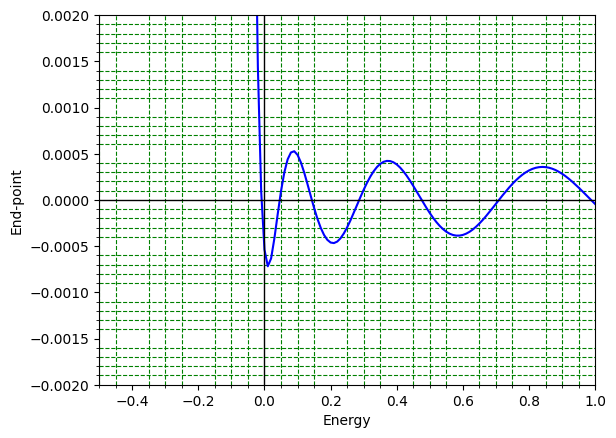

Enter 1st energy guess :  0
Enter 2nd energy guess :  0.1


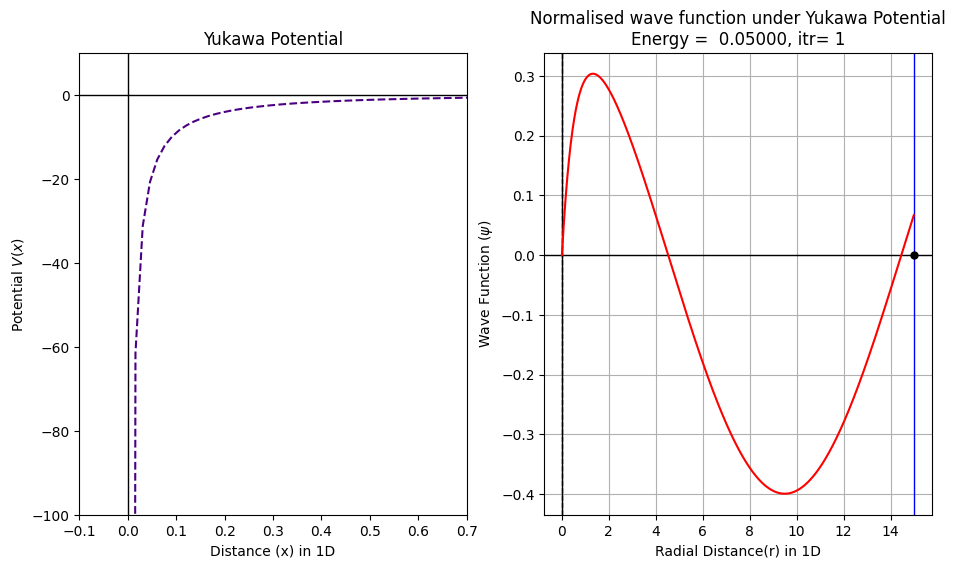

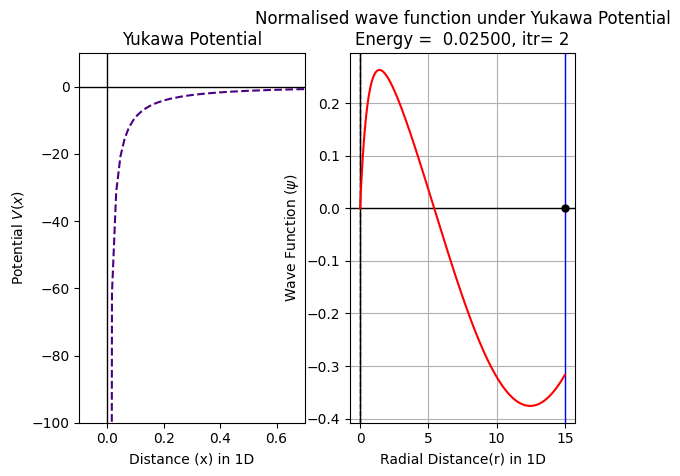

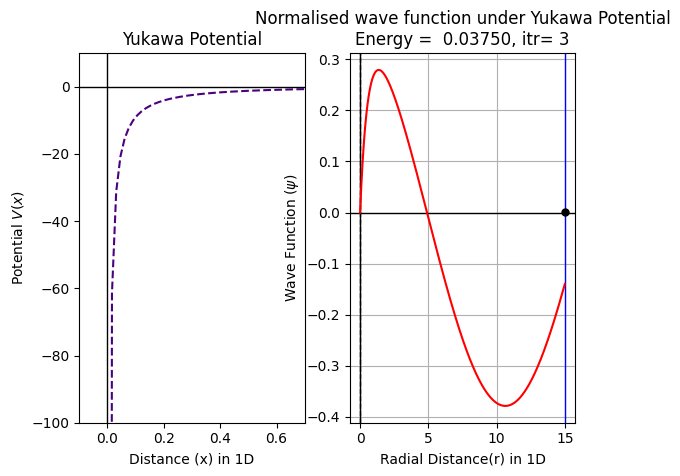

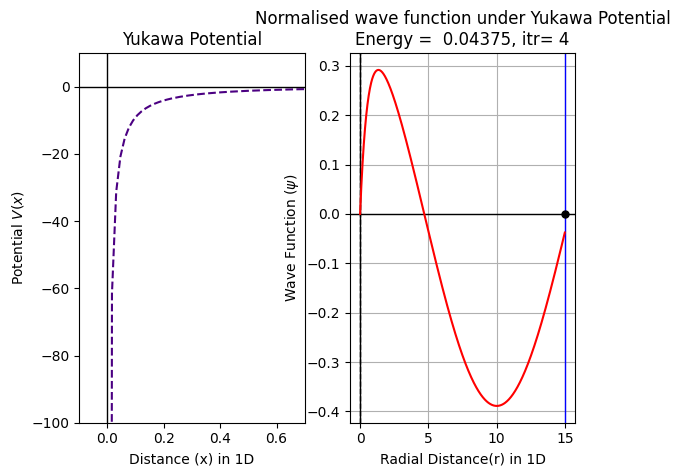

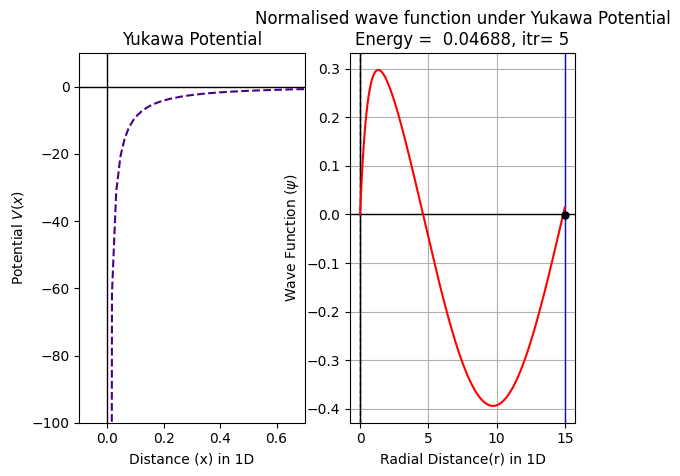

...

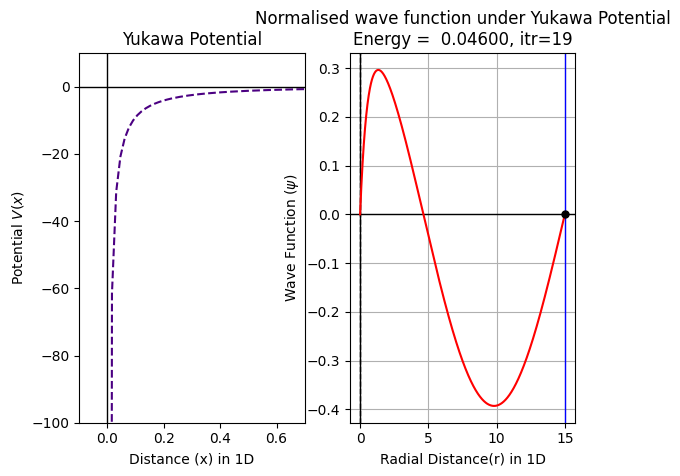

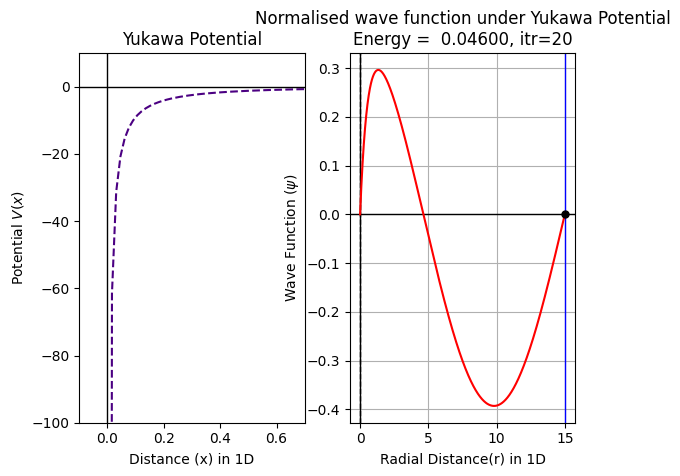

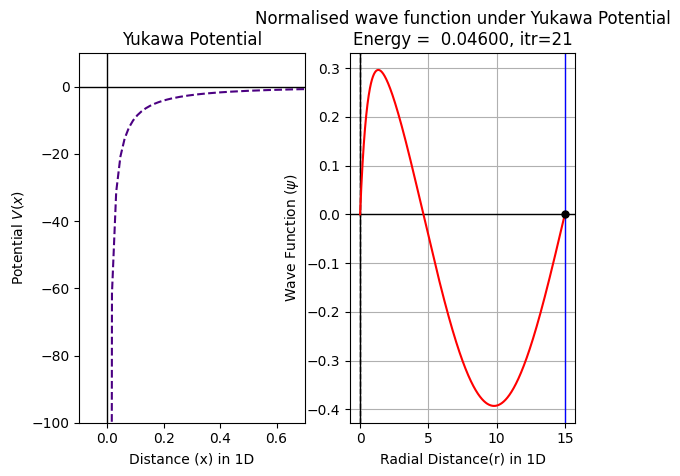

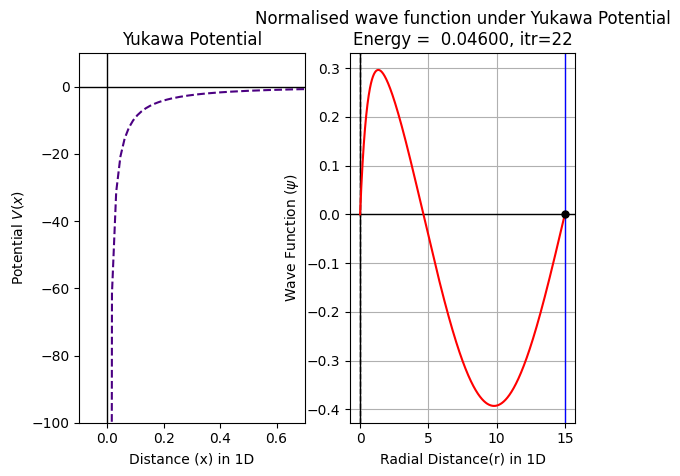

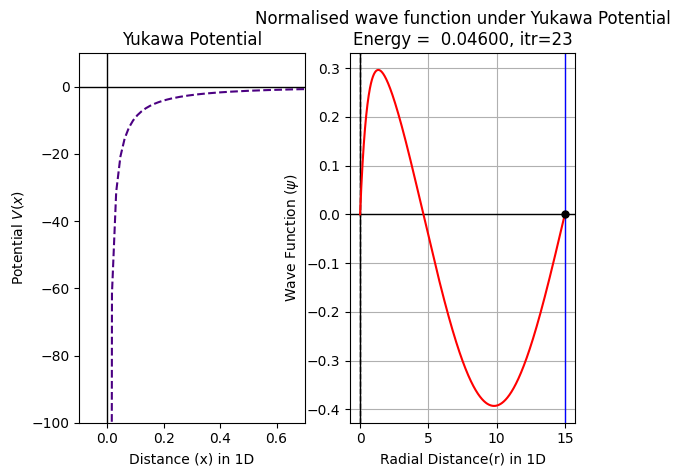

The energy satisfying the boundary condition is 0.04600113034248352


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint,simpson

#Define the dimensionless potential
def V(r):
    b=1
    return -(1/r)*np.exp(-r/b)

#Define the dimensionless Time Independent Schrodinger Equation in odeint()
def Yukawa(y,r,E):
    y1=y[0]
    y2=y[1]
    yp1=y2
    yp2=-2*(E-V(r))*y1
    yp=[yp1,yp2]
    return yp

#Boundary Conditions for a wave function
r0,y0,rn,yn=0.001,0,15,0
n=1000
h=(rn-r0)/n
r=np.arange(r0,rn,h)          
L=len(r)
alpha=0.001         #Initial derivative (can be anything as it doesn't control the solution after normalization)
y0=[0.00,alpha]     #Initial condition for y and y' 
      


#Guessing energy value from plot
def shoot(E):
    u=odeint(Yukawa,y0,r,args=(E,))
    return u[:,0][-1]

#Energies are negative (but finite) if Yukawa Potential supports bound states but the system here allows positive energies for bound states  as it is bounded from both ends with infinite potential at finite distance
energies=np.arange(-10,10,0.01)
H=[]
for i in energies:
    hits=shoot(i)
    H.append(hits)
    
plt.plot(energies,H,'b-')
plt.axhline(color='black',lw=1)
plt.axvline(color='black',lw=1)
plt.xlabel('Energy')
plt.ylabel('End-point')
plt.xlim(-0.5,1)
plt.ylim(-0.002,0.002)
plt.minorticks_on()
plt.grid(which='minor',color='green',ls='--')
plt.show()


#Bisection-Shooting method for proper choice of energy
while True:
    E1=eval(input('Enter 1st energy guess : '))
    E2=eval(input('Enter 2nd energy guess : '))
    uA=odeint(Yukawa,y0,r,args=(E1,))
    uB=odeint(Yukawa,y0,r,args=(E2,))
    solA=uA[:,0]
    solB=uB[:,0]
    if solA[L-1]*solB[L-1]<0.0:
        break
    else:
        print('Incorrect sssumption of guesses\nEnter new guesses')


itr=0
plt.figure(figsize=(11,6)) 
while True:
    u1=odeint(Yukawa,y0,r,args=(E1,))
    sol1=u1[:,0]
    u2=odeint(Yukawa,y0,r,args=(E2,))
    sol2=u2[:,0]
    E3=(E1+E2)/2
    u3=odeint(Yukawa,y0,r,args=(E3,))
    sol3=u3[:,0]
    if sol1[L-1]*sol3[L-1]==0:
        break
    if sol1[L-1]*sol3[L-1]<0.0:
        E2=E3
    else:
        E1=E3
    itr=itr+1
    acc=abs(E1-E2)
    if acc<0.00000001:
        break
    

#Normalisation of wave function
    N=1/np.sqrt(simpson(sol3*sol3,x=r))
    sol3=N*sol3
    
#Plotting and printing
    plt.subplot(121)
    plt.plot(r,V(r),'--',color='indigo')
    plt.ylabel(r'Potential $V(x)$')
    plt.xlabel('Distance (x) in 1D')
    plt.title('Yukawa Potential')
    plt.ylim(-100,10)
    plt.xlim(-0.1,0.7)
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
      
    plt.subplot(122)
    plt.cla()
    plt.title('Normalised wave function under Yukawa Potential\n'+r'Energy =%9.5f, itr=%2i'%(E3,itr))
    plt.xlabel('Radial Distance(r) in 1D')
    plt.ylabel(r'Wave Function ($\psi$)')
    plt.grid()
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    plt.axvline(x=rn,color='blue',lw=1)
    plt.axvline(x=r0,color='black',lw=1,ls='--')
    plt.plot(r,sol3,'r',lw=1.5)
    plt.plot(r[-1],-u3[-1,0],'o',color='black',ms=5)
    plt.pause(0.5)
    
plt.show()
print('The energy satisfying the boundary condition is',E3)

# Solution of Schrodinger's 1D wave equation for Morse potential
Using Odeint()

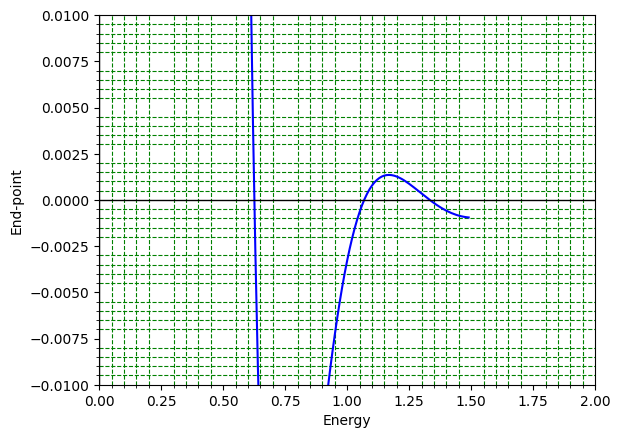

Enter 1st energy guess :  0.9
Enter 2nd energy guess :  1.12


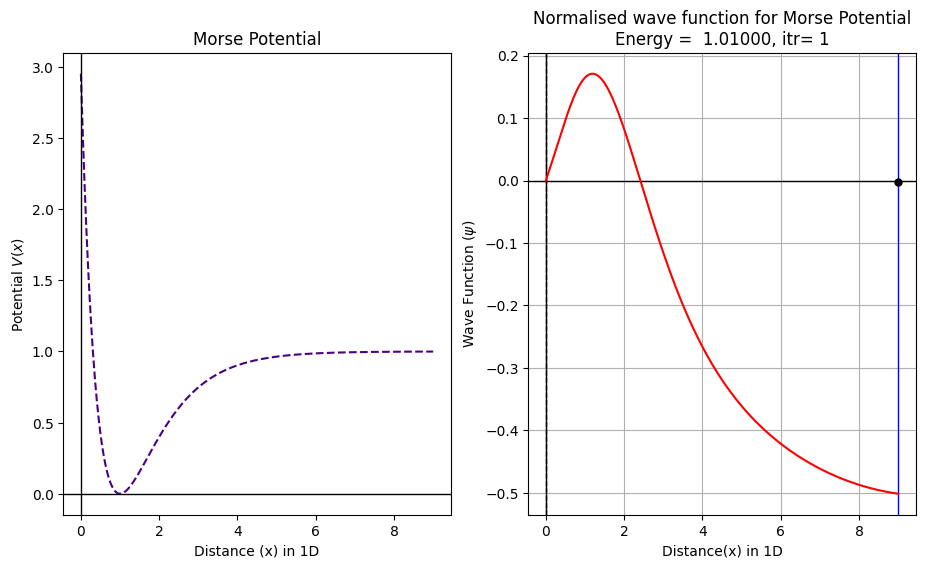

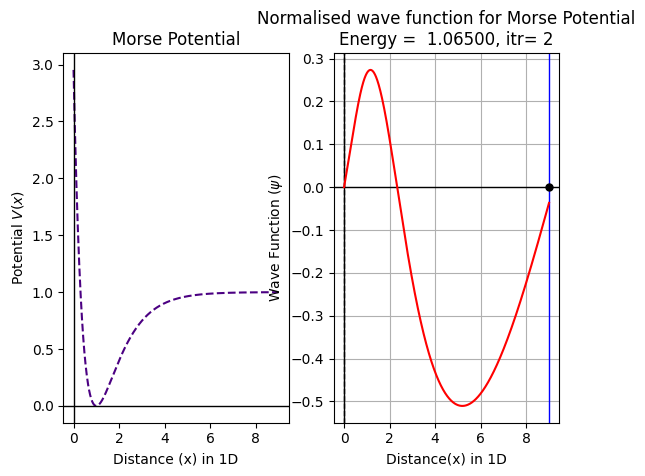

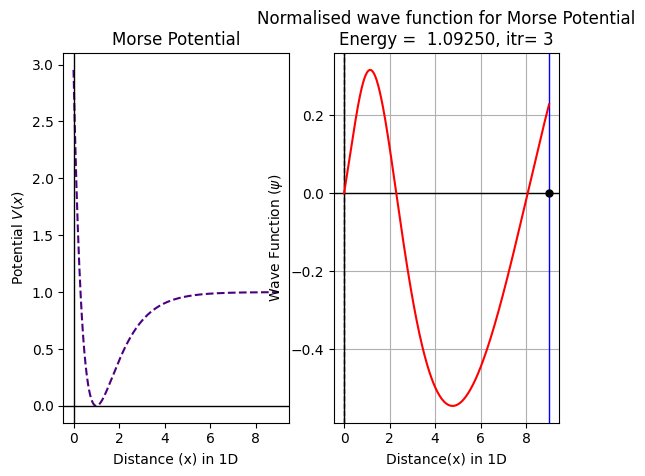

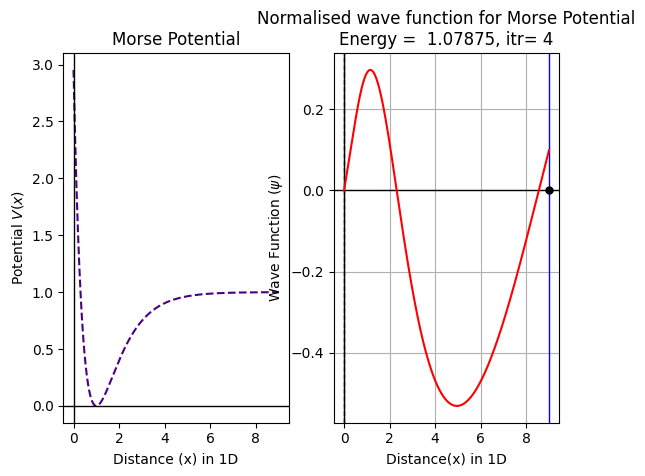

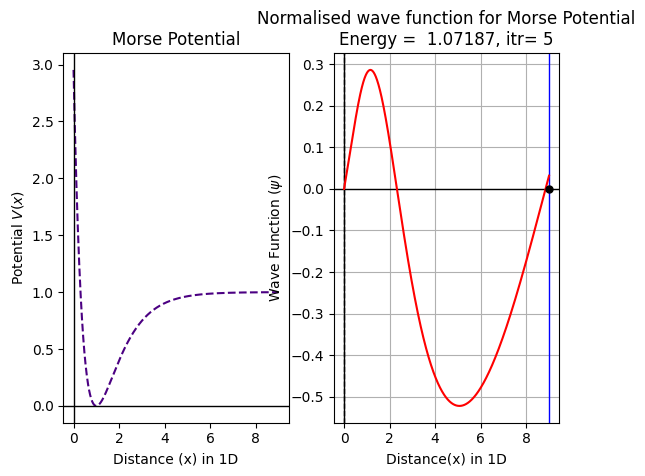

...

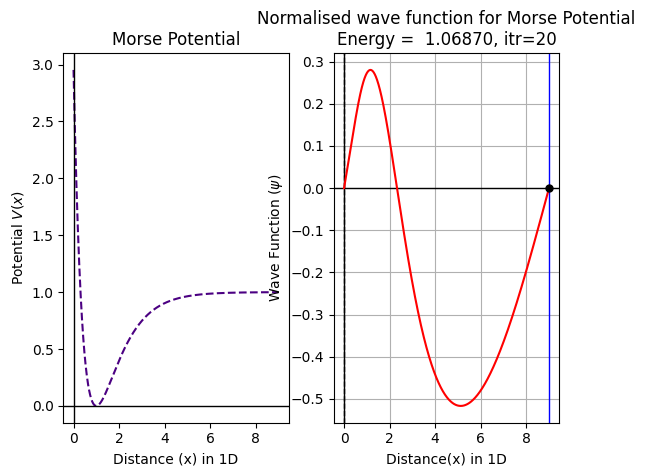

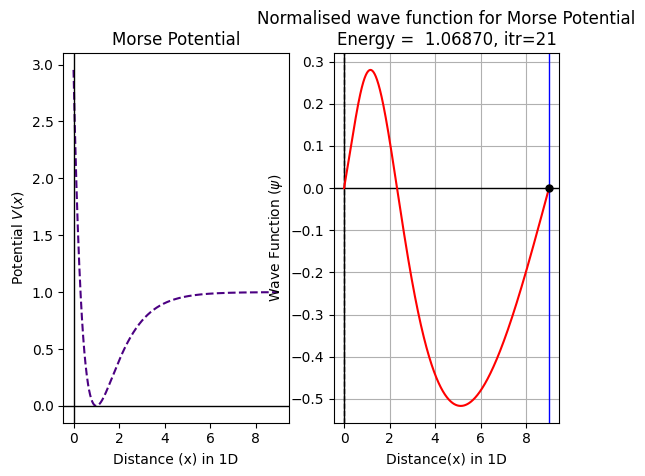

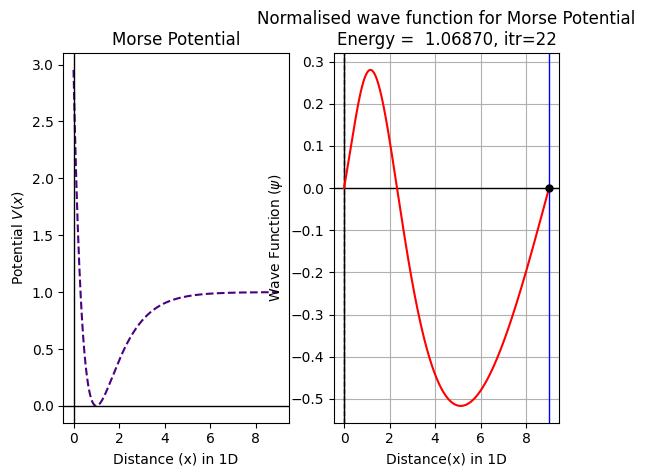

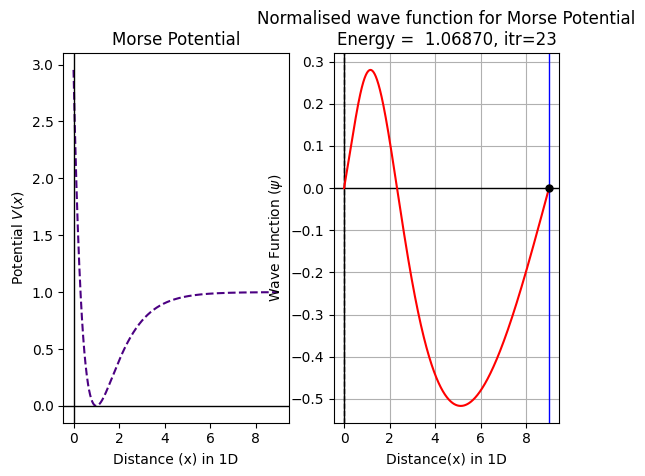

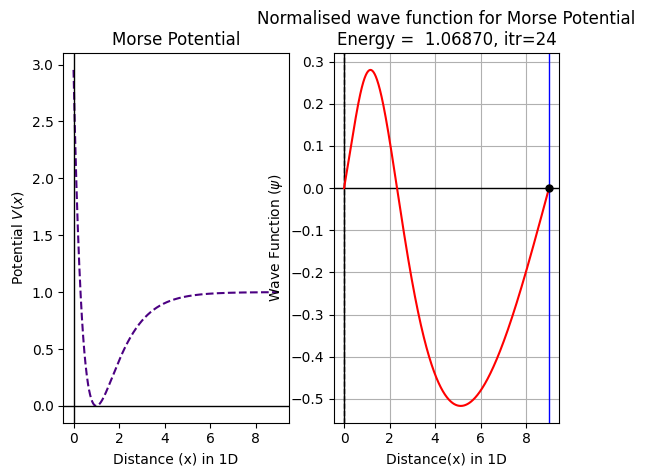

The energy satisfying the boundary condition is 1.068698849081993


In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint,simpson

#Define the dimensionless potential
def V(x):
    D=1
    b=1
    return D*(1-np.exp(-(x-b)))**2 

#Define the dimensionless Time Independent Schrodinger Equation in odeint()
def Morse(y,x,E):
    y1=y[0]
    y2=y[1]
    yp1=y2                
    yp2=-2*(E-V(x))*y1
    yp=[yp1,yp2]
    return yp

#Boundary Conditions for a wave function
x0,y0,xn,yn=0,0,9,0
n=1000
h=(xn-x0)/n
x=np.arange(x0,xn,h)
L=len(x)
alpha=0.001         #Initial derivative (can be anything as it doesn't control the solution after normalization)
y0=[0.00,alpha]     #Initial condition for y and y' 
      


#Guessing energy value from plot
def shoot(E):
    u=odeint(Morse,y0,x,args=(E,))
    return u[:,0][-1]

energies=np.arange(0,1.5,0.01)
H=[]
for i in energies:
    hits=shoot(i)
    H.append(hits)
    
plt.plot(energies,H,'b-')
plt.axhline(color='black',lw=1)
plt.axvline(color='black',lw=1)
plt.xlabel('Energy')
plt.ylabel('End-point')
plt.ylim(-0.01,0.01)
plt.xlim(0,2)
plt.minorticks_on()
plt.grid(which='minor',color='green',ls='--')
plt.show()


#Bisection-shooting method for proper choice of energy
while True:
    E1=eval(input('Enter 1st energy guess : '))
    E2=eval(input('Enter 2nd energy guess : '))
    uA=odeint(Morse,y0,x,args=(E1,))
    uB=odeint(Morse,y0,x,args=(E2,))
    solA=uA[:,0]
    solB=uB[:,0]
    if solA[L-1]*solB[L-1]<0.0:
        break
    else:
        print('Incorrect sssumption of guesses\nEnter new guesses')


itr=0
plt.figure(figsize=(11,6)) 
while True:
    u1=odeint(Morse,y0,x,args=(E1,))
    sol1=u1[:,0]
    u2=odeint(Morse,y0,x,args=(E2,))
    sol2=u2[:,0]
    E3=(E1+E2)/2
    u3=odeint(Morse,y0,x,args=(E3,))
    sol3=u3[:,0]
    if sol1[L-1]*sol3[L-1]==0:
        break
    if sol1[L-1]*sol3[L-1]<0.0:
        E2=E3
    else:
        E1=E3
    itr=itr+1
    acc=abs(E1-E2)
    if acc<0.00000001:
        break
    
    
#Normalisation of wave function
    N=1/np.sqrt(simpson(sol3*sol3,x=x))
    sol3=N*sol3
    
#Plotting and printing
    plt.subplot(121)
    plt.plot(x,V(x),'--',color='indigo')
    plt.ylabel(r'Potential $V(x)$')
    plt.xlabel('Distance (x) in 1D')
    plt.title('Morse Potential')
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    
    plt.subplot(122)
    plt.cla()
    plt.title('Normalised wave function for Morse Potential\n'+r'Energy =%9.5f, itr=%2i'%(E3,itr))
    plt.xlabel('Distance(x) in 1D')
    plt.ylabel(r'Wave Function ($\psi$)')
    plt.grid()
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    plt.axvline(x=xn,color='blue',lw=1)
    plt.axvline(x=x0,color='black',lw=1,ls='--')
    plt.plot(x,sol3,'r',lw=1.5)
    plt.plot(x[-1],u3[-1,0],'o',color='black',ms=5)
    plt.pause(0.5)
    
plt.show()
print('The energy satisfying the boundary condition is',E3)

# Solution of Schrodinger's 1D wave equation for Square Well potential
Using Odeint()

Enter the width of the potential well :  5
Enter the well potential :  0


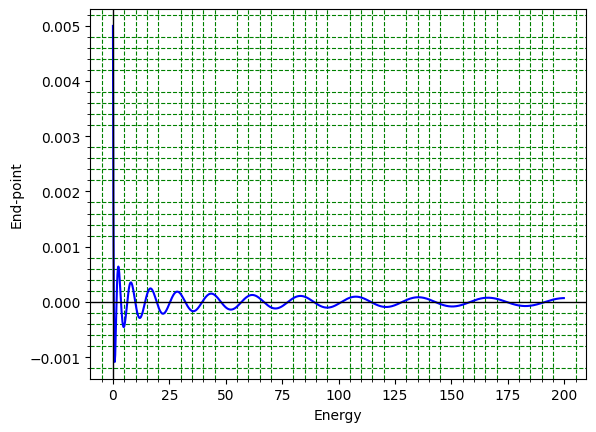

Enter 1st energy guess :  0
Enter 2nd energy guess :  0.5


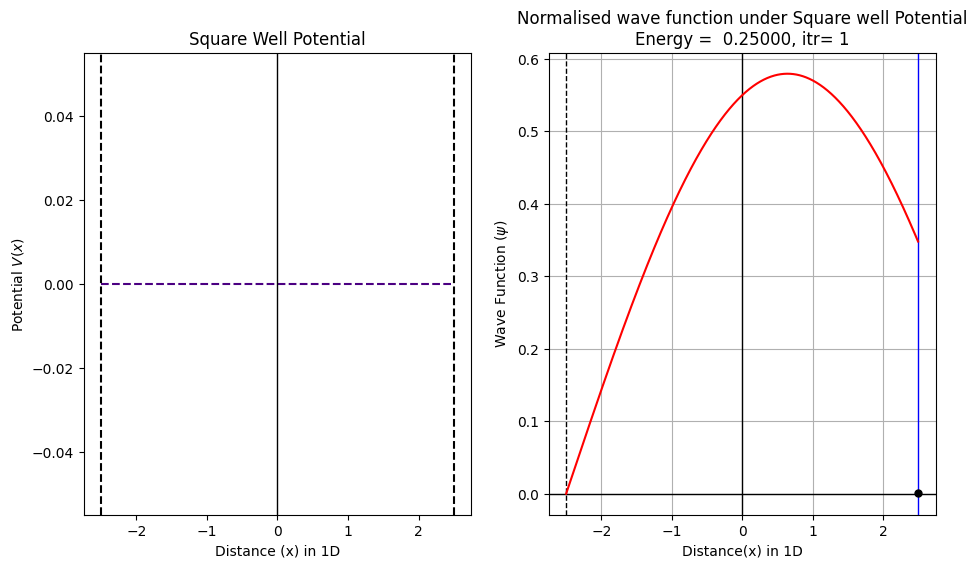

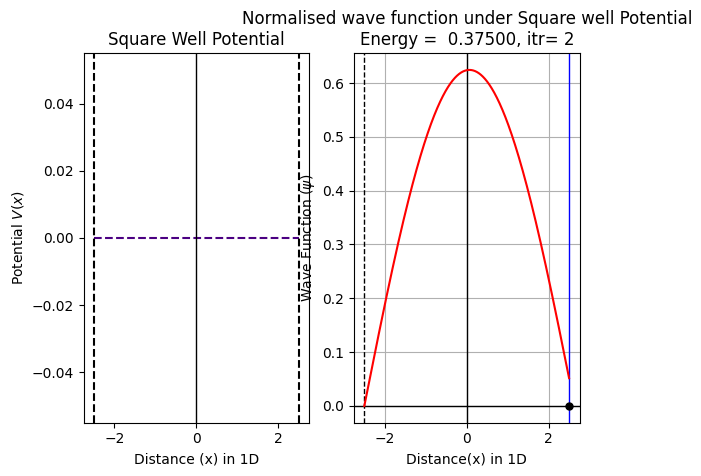

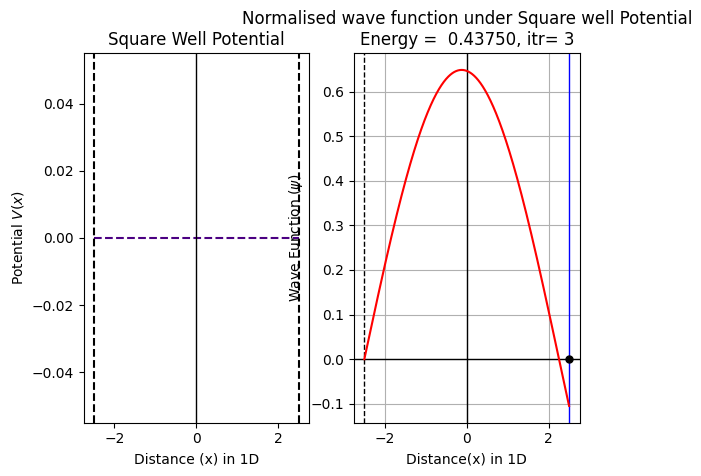

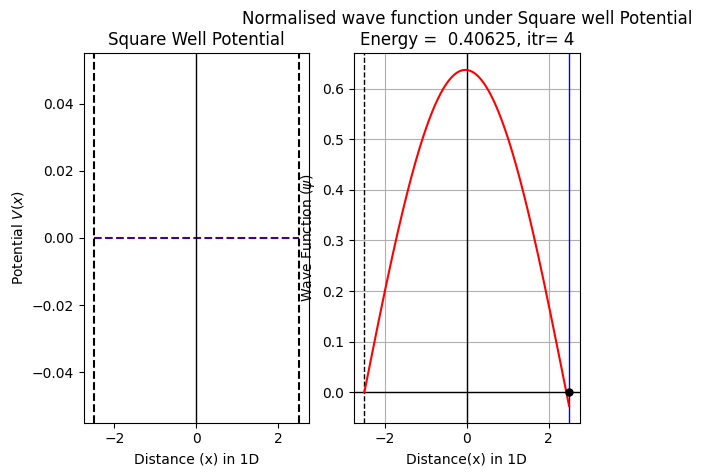

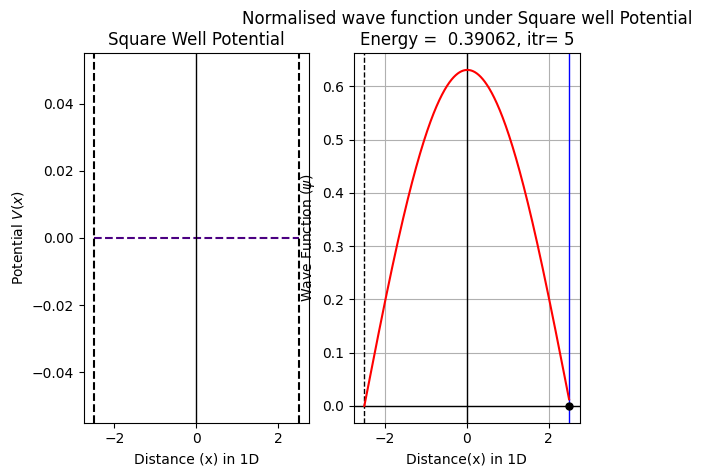

...

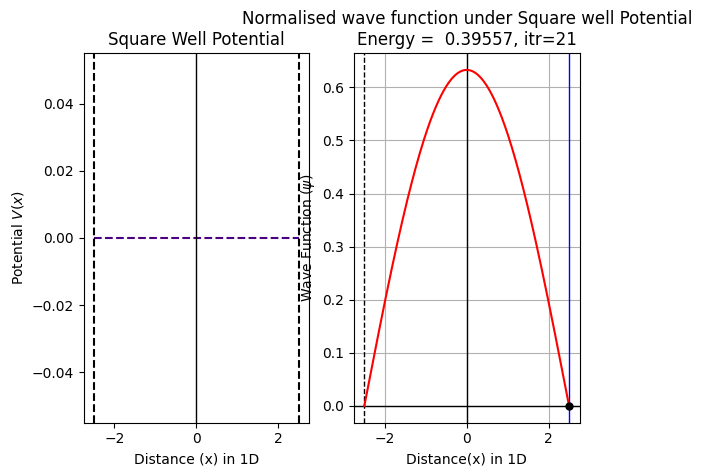

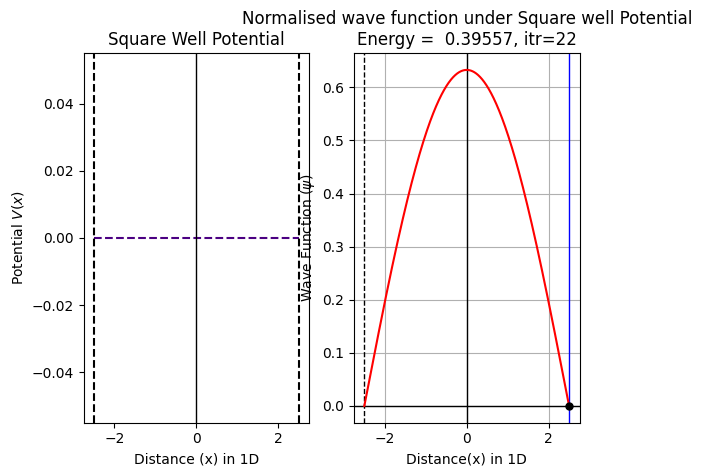

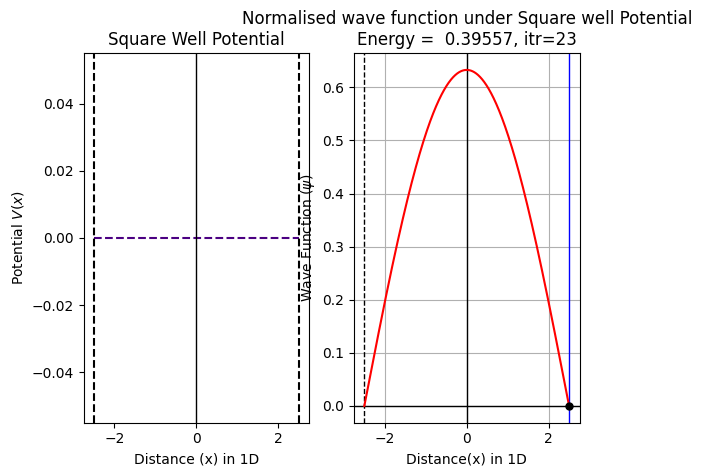

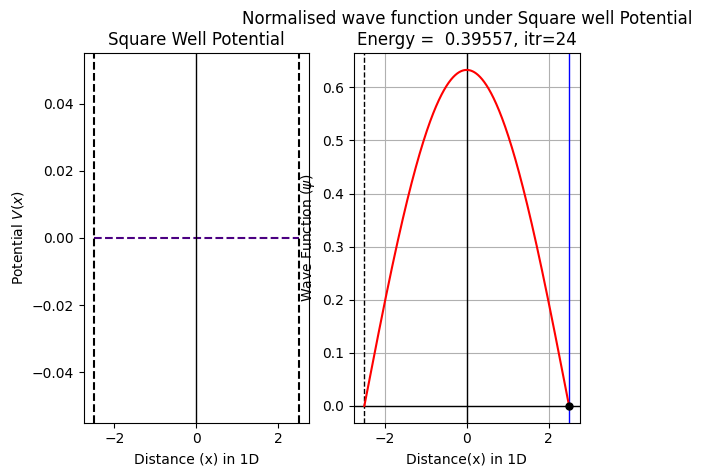

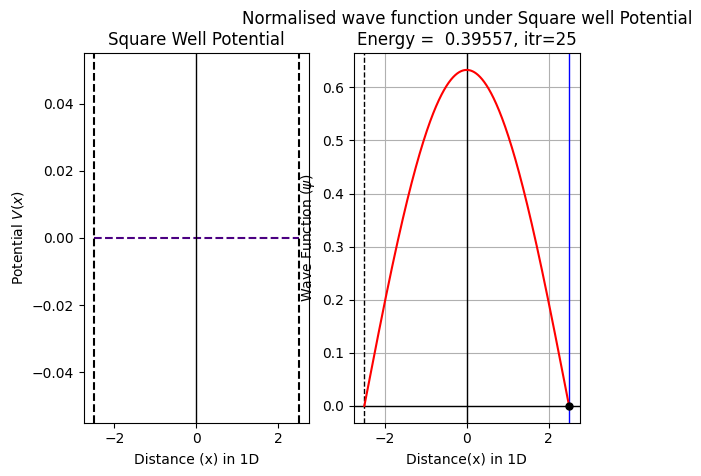

The energy satisfying the boundary condition is 0.3955700024962425


In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint,simpson


#Define the dimensionless potential
def V(x,a,V0):
    k=0
    return k*(x)-V0

a=eval(input('Enter the width of the potential well : ' ))
V0=eval(input('Enter the well potential : ' ))

#Define the dimensionless Time Independent Schrodinger Equation in odeint()
def square(y,x,E):
    y1=y[0]
    y2=y[1]
    yp1=y2
    yp2=-(E-V(x,a,V0))*y1
    yp=[yp1,yp2]
    return yp

#Boundary Conditions for a wave function
x0,y0,xn,yn=-a/2,0,a/2,0
n=1000
h=(xn-x0)/n
x=np.arange(x0,xn,h)
L=len(x)
alpha=0.001         #Initial derivative (can be anything as it doesn't control the solution after normalization)
y0=[0.00,alpha]     #Initial condition for y and y' 
      


#Guessing energy value from plot
def shoot(E):
    u=odeint(square,y0,x,args=(E,))
    return u[:,0][-1]

energies=np.arange(0,200,0.2)
H=[]
for i in energies:
    hits=shoot(i)
    H.append(hits)
    
plt.plot(energies,H,'b-')
plt.axhline(color='black',lw=1)
plt.axvline(color='black',lw=1)
plt.xlabel('Energy')
plt.ylabel('End-point')
plt.minorticks_on()
plt.grid(which='minor',color='green',ls='--')
plt.show()


#Bisection-Shooting method for proper choice of energy
while True:
    E1=eval(input('Enter 1st energy guess : '))
    E2=eval(input('Enter 2nd energy guess : '))
    uA=odeint(square,y0,x,args=(E1,))
    uB=odeint(square,y0,x,args=(E2,))
    solA=uA[:,0]
    solB=uB[:,0]
    if solA[L-1]*solB[L-1]<0.0:
        break
    else:
        print('Incorrect sssumption of guesses\nEnter new guesses')


itr=0
plt.figure(figsize=(11,6)) 
while True:
    u1=odeint(square,y0,x,args=(E1,))
    sol1=u1[:,0]
    u2=odeint(square,y0,x,args=(E2,))
    sol2=u2[:,0]
    E3=(E1+E2)/2
    u3=odeint(square,y0,x,args=(E3,))
    sol3=u3[:,0]
    if sol1[L-1]*sol3[L-1]==0:
        break
    if sol1[L-1]*sol3[L-1]<0.0:
        E2=E3
    else:
        E1=E3
    itr=itr+1
    acc=abs(E1-E2)
    if acc<0.00000001:
        break
    

#Normalisation of wave function
    N=1/np.sqrt(simpson(sol3*sol3,x=x))
    sol3=N*sol3
    
#Plotting and printing
    plt.subplot(121)
    plt.plot(x,V(x,a,V0),'--',color='indigo')
    plt.ylabel(r'Potential $V(x)$')
    plt.xlabel('Distance (x) in 1D')
    plt.title('Square Well Potential')
    plt.axvline(color='black',lw=1)
    plt.axvline(x=-a/2,color='black',ls='--')
    plt.axvline(x=a/2,color='black',ls='--')
     
    plt.subplot(122)
    plt.cla()
    plt.title('Normalised wave function under Square well Potential\n'+r'Energy =%9.5f, itr=%2i'%(E3,itr))
    plt.xlabel('Distance(x) in 1D')
    plt.ylabel(r'Wave Function ($\psi$)')
    plt.grid()
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    plt.axvline(x=xn,color='blue',lw=1)
    plt.axvline(x=x0,color='black',lw=1,ls='--')
    plt.plot(x,sol3,'r',lw=1.5)
    plt.plot(x[n-1],u3[-1,0],'o',color='black',ms=5)
    plt.pause(0.5)

plt.show()
print('The energy satisfying the boundary condition is',E3)

# Solution of Schrodinger's 1D wave equation for Triangular potential
Using Odeint()

Enter the width of the triangular well :  5
Enter the slope of the potential :  1


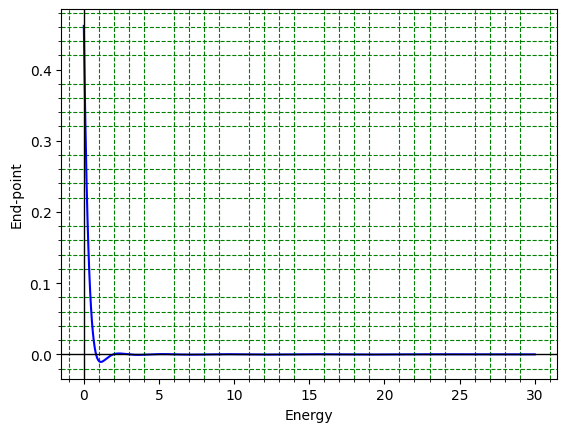

Enter 1st energy guess :  0
Enter 2nd energy guess :  1


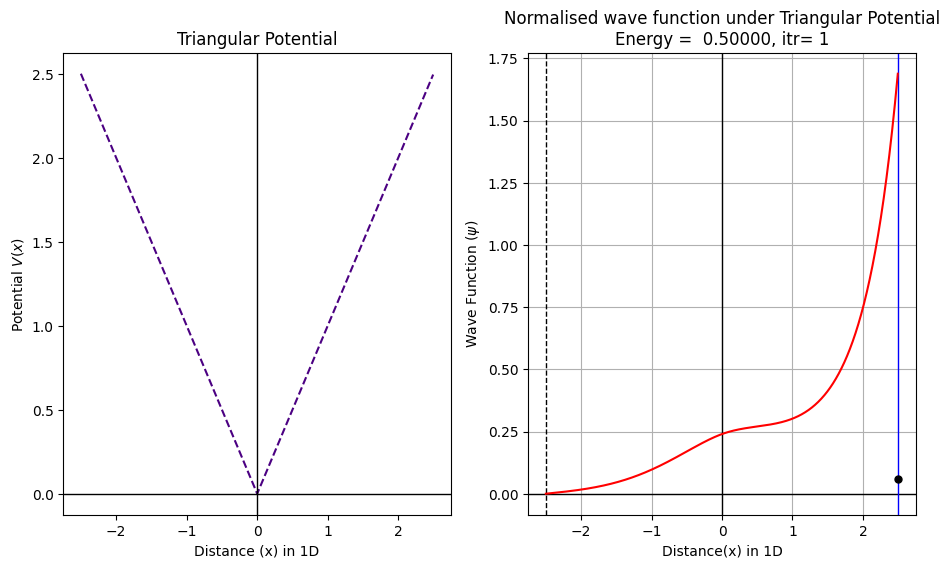

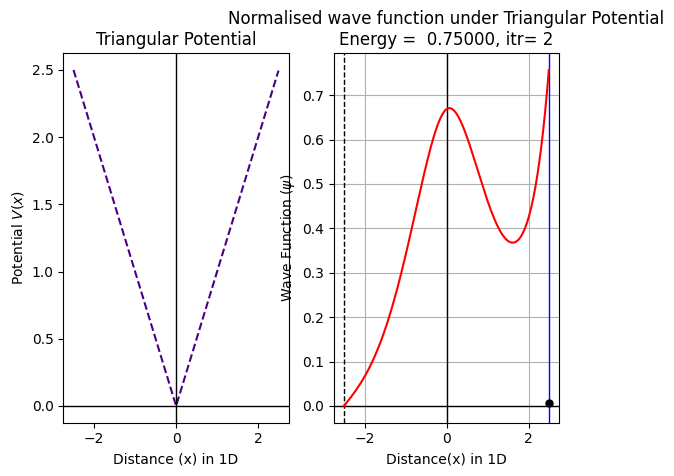

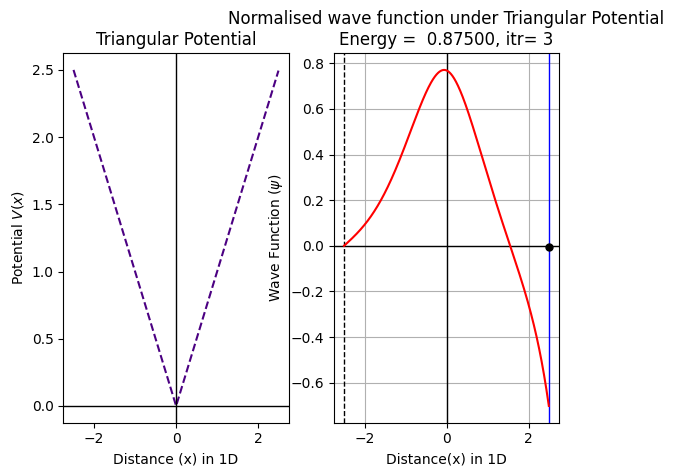

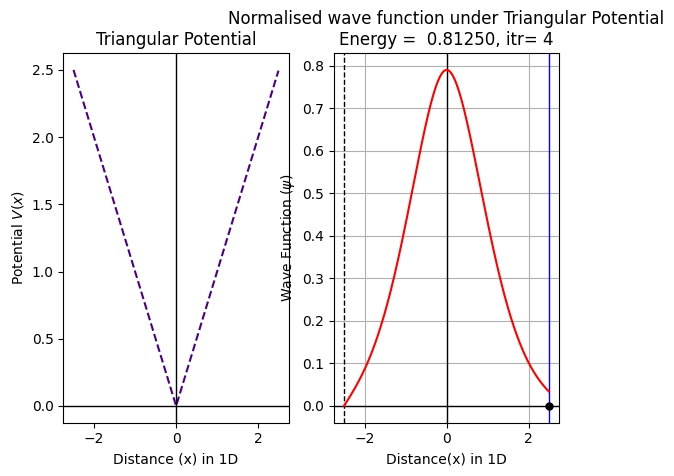

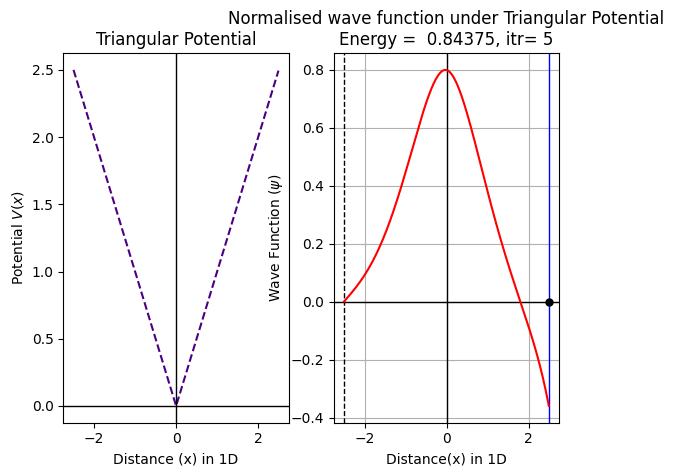

...

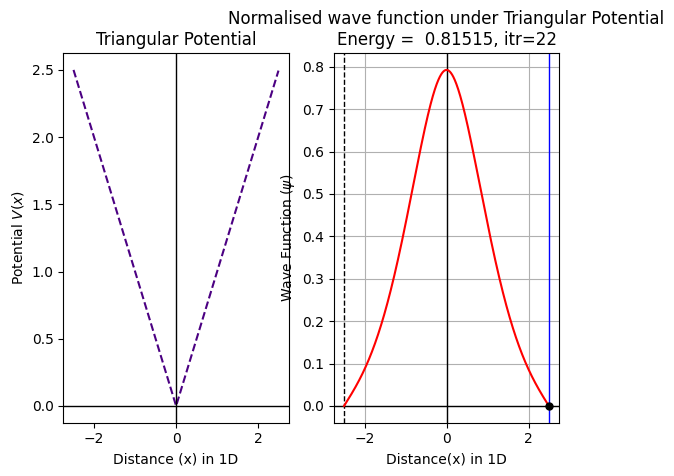

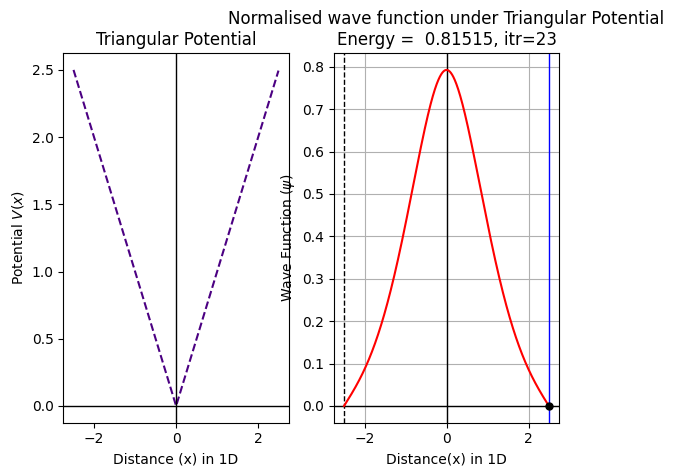

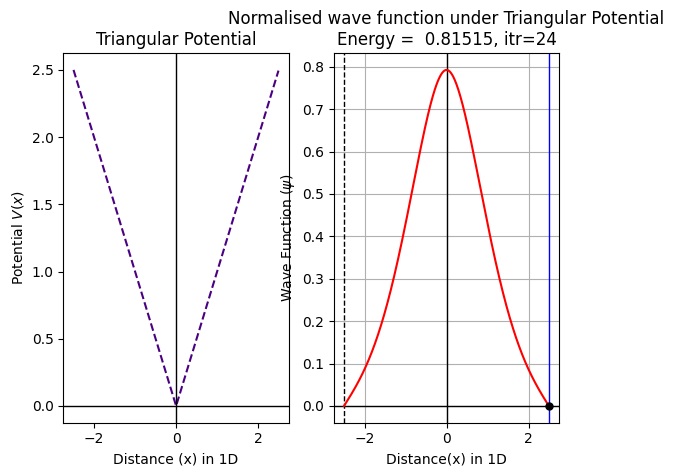

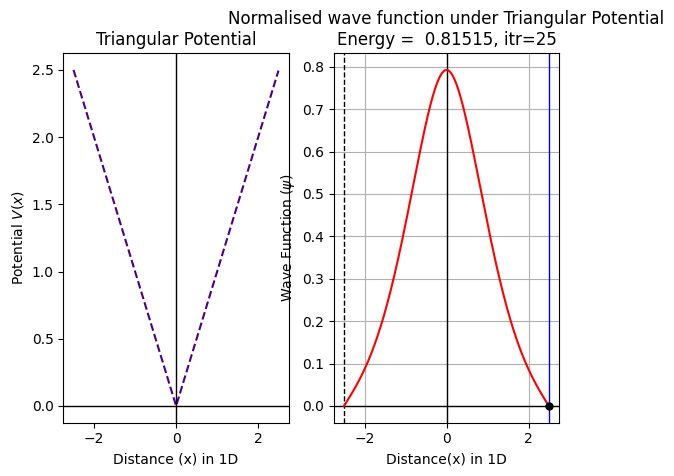

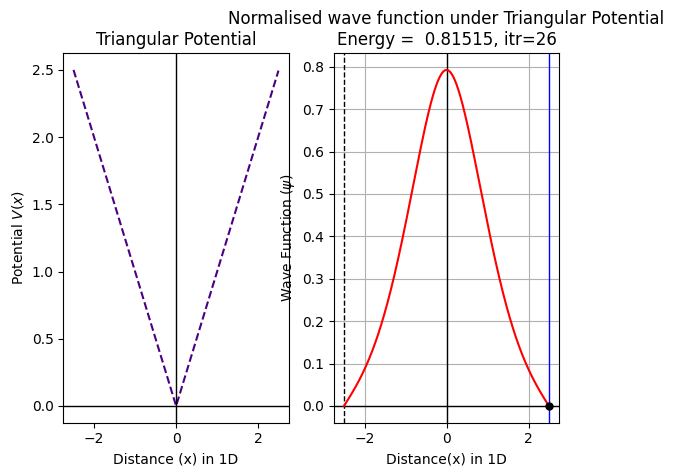

The energy satisfying the boundary condition is 0.8151465132832527


In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint,simpson


#Define the dimensionless potential
def V(k,x):
        return k*abs(x)

a=eval(input('Enter the width of the triangular well : ' ))
k=eval(input('Enter the slope of the potential : '))
k=abs(k)

#Define the dimensionless Time Independent Schrodinger Equation in odeint()
def triang(y,x,E):
    y1=y[0]
    y2=y[1]
    yp1=y2
    yp2=-2*(E-V(k,x))*y1
    yp=[yp1,yp2]
    return yp

#Boundary Conditions for a wave function
x0,y0,xn,yn=-a/2,0,a/2,0
n=1000
h=(xn-x0)/n
x=np.arange(x0,xn,h)
L=len(x)
alpha=0.001         #Initial derivative (can be anything as it doesn't control the solution after normalization)
y0=[0.00,alpha]     #Initial condition for y and y' 
      


#Guessing energy value from plot
def shoot(E):
    u=odeint(triang,y0,x,args=(E,))
    return u[:,0][-1]

energies=np.linspace(0,30,1000)
H=[]
for i in energies:
    hits=shoot(i)
    H.append(hits)
    
plt.plot(energies,H,'b-')
plt.axhline(color='black',lw=1)
plt.axvline(color='black',lw=1)
plt.xlabel('Energy')
plt.ylabel('End-point')
plt.minorticks_on()
plt.grid(which='minor',color='green',ls='--')
plt.show()


#Bisection-Shooting method for proper choice of energy
while True:
    E1=eval(input('Enter 1st energy guess : '))
    E2=eval(input('Enter 2nd energy guess : '))
    uA=odeint(triang,y0,x,args=(E1,))
    uB=odeint(triang,y0,x,args=(E2,))
    solA=uA[:,0]
    solB=uB[:,0]
    if solA[L-1]*solB[L-1]<0.0:
        break
    else:
        print('Incorrect sssumption of guesses\nEnter new guesses')


itr=0
plt.figure(figsize=(11,6)) 
while True:
    u1=odeint(triang,y0,x,args=(E1,))
    sol1=u1[:,0]
    u2=odeint(triang,y0,x,args=(E2,))
    sol2=u2[:,0]
    E3=(E1+E2)/2
    u3=odeint(triang,y0,x,args=(E3,))
    sol3=u3[:,0]
    if sol1[L-1]*sol3[L-1]==0:
        break
    if sol1[L-1]*sol3[L-1]<0.0:
        E2=E3
    else:
        E1=E3
    itr=itr+1
    acc=abs(E1-E2)
    if acc<0.00000001:
        break
    
    
#Normalisation of wave function
    N=1/np.sqrt(simpson(sol3*sol3,x=x))
    sol3=N*sol3
    
#Plotting and printing
    plt.subplot(121)
    plt.plot(x,V(k,x),'--',color='indigo')
    plt.ylabel(r'Potential $V(x)$')
    plt.xlabel('Distance (x) in 1D')
    plt.title('Triangular Potential')
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
  
    plt.subplot(122)
    plt.cla()
    plt.title('Normalised wave function under Triangular Potential\n'+r'Energy =%9.5f, itr=%2i'%(E3,itr))
    plt.xlabel('Distance(x) in 1D')
    plt.ylabel(r'Wave Function ($\psi$)')
    plt.grid()
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    plt.axvline(x=xn,color='blue',lw=1)
    plt.axvline(x=x0,color='black',lw=1,ls='--')
    plt.plot(x,sol3,'r',lw=1.5)
    plt.plot(x[n-1],u3[-1,0],'o',color='black',ms=5)
    plt.pause(0.5)

plt.show()
print('The energy satisfying the boundary condition is',E3)